<a href="https://colab.research.google.com/github/CrimsonRed89/Ocular-Disease-Recognition-Test-On-Various-Models-Deep-Learning/blob/main/ODIR_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
#https://www.kaggle.com/datasets/andrewmvd/ocular-disease-recognition-odir5k
!kaggle datasets download -d andrewmvd/ocular-disease-recognition-odir5k

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/ocular-disease-recognition-odir5k
License(s): other
100% 1.62G/1.62G [00:50<00:00, 34.2MB/s]
100% 1.62G/1.62G [00:50<00:00, 34.5MB/s]


In [ ]:
!unzip ocular-disease-recognition-odir5k.zip

Streaming output truncated to the last 5000 lines.
  inflating: preprocessed_images/2179_left.jpg  
  inflating: preprocessed_images/2179_right.jpg  
  inflating: preprocessed_images/217_left.jpg  
  inflating: preprocessed_images/217_right.jpg  
  inflating: preprocessed_images/2180_left.jpg  
  inflating: preprocessed_images/2180_right.jpg  
  inflating: preprocessed_images/2181_left.jpg  
  inflating: preprocessed_images/2181_right.jpg  
  inflating: preprocessed_images/2182_left.jpg  
  inflating: preprocessed_images/2182_right.jpg  
  inflating: preprocessed_images/2183_left.jpg  
  inflating: preprocessed_images/2183_right.jpg  
  inflating: preprocessed_images/2184_left.jpg  
  inflating: preprocessed_images/2184_right.jpg  
  inflating: preprocessed_images/2185_left.jpg  
  inflating: preprocessed_images/2185_right.jpg  
  inflating: preprocessed_images/2187_left.jpg  
  inflating: preprocessed_images/2187_right.jpg  
  inflating: preprocessed_images/2189_left.jpg  
  inflating

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import tensorflow as tf


In [ ]:
fulldf = pd.read_csv("/content/full_df.csv")

In [ ]:
fulldf.head(5)

,ID,Patient Age,Patient Sex,Left-Fundus,Right-Fundus,Left-Diagnostic Keywords,Right-Diagnostic Keywords,N,D,G,C,A,H,M,O,filepath,labels,target,filename
0,0,69,Female,0_left.jpg,0_right.jpg,cataract,normal fundus,0,0,0,1,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",0_right.jpg
1,1,57,Male,1_left.jpg,1_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",1_right.jpg
2,2,42,Male,2_left.jpg,2_right.jpg,laser spot，moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",2_right.jpg
3,4,53,Male,4_left.jpg,4_right.jpg,macular epiretinal membrane,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",4_right.jpg
4,5,50,Female,5_left.jpg,5_right.jpg,moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",5_right.jpg


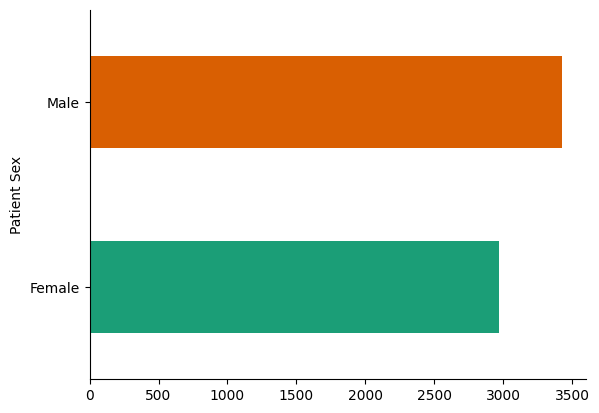

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
fulldf.groupby('Patient Sex').size().plot(kind='barh', color=sns.color_palette('Dark2'))
plt.gca().spines[['top', 'right']].set_visible(False)
plt.show()


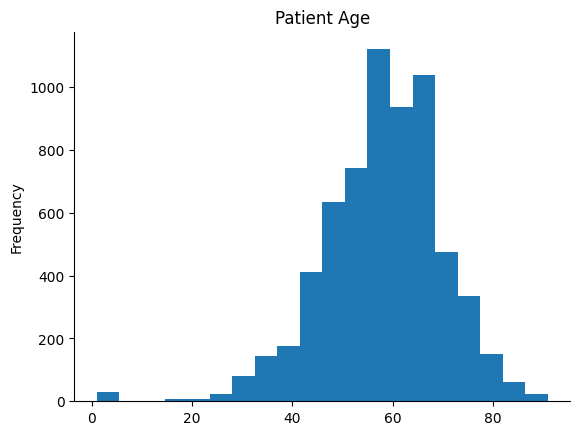

In [ ]:
fulldf['Patient Age'].plot(kind='hist', bins=20, title='Patient Age')
plt.gca().spines[['top', 'right',]].set_visible(False)

<function matplotlib.pyplot.gca()>

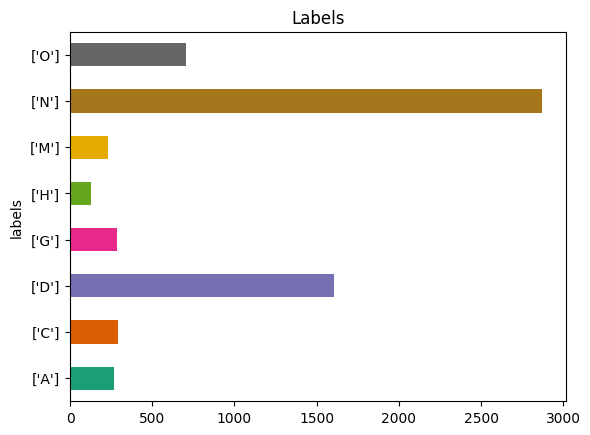

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
fulldf.groupby('labels').size().plot(kind='barh', color=sns.color_palette('Dark2'))
plt.title('Labels')
plt.gca


In [ ]:
fulldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6392 entries, 0 to 6391
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   ID                         6392 non-null   int64 
 1   Patient Age                6392 non-null   int64 
 2   Patient Sex                6392 non-null   object
 3   Left-Fundus                6392 non-null   object
 4   Right-Fundus               6392 non-null   object
 5   Left-Diagnostic Keywords   6392 non-null   object
 6   Right-Diagnostic Keywords  6392 non-null   object
 7   N                          6392 non-null   int64 
 8   D                          6392 non-null   int64 
 9   G                          6392 non-null   int64 
 10  C                          6392 non-null   int64 
 11  A                          6392 non-null   int64 
 12  H                          6392 non-null   int64 
 13  M                          6392 non-null   int64 
 14  O       

In [ ]:
print(fulldf.dtypes)

ID                            int64
Patient Age                   int64
Patient Sex                  object
Left-Fundus                  object
Right-Fundus                 object
Left-Diagnostic Keywords     object
Right-Diagnostic Keywords    object
N                             int64
D                             int64
G                             int64
C                             int64
A                             int64
H                             int64
M                             int64
O                             int64
filepath                     object
labels                       object
target                       object
filename                     object
dtype: object


In [ ]:
def has_condn(term, text):
    if term in text:
        return 1
    else:
        return 0

In [ ]:
fulldf.describe()

,ID,Patient Age,N,D,G,C,A,H,M,O
count,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000
mean,2271.150814,57.857947,0.328692,0.332134,0.062109,0.062891,0.049906,0.031758,0.047872,0.248436
std,1417.559018,11.727737,0.469775,0.471016,0.241372,0.242786,0.217768,0.175370,0.213513,0.432139
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,920.750000,51.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2419.500000,59.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3294.000000,66.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,4784.000000,91.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
def process_dataset(data):

    data["left_cataract"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("cataract",x))
    data["right_cataract"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("cataract",x))

    data["LD"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("non proliferative retinopathy",x))
    data["RD"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("non proliferative retinopathy",x))

    data["LG"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("glaucoma",x))
    data["RG"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("glaucoma",x))

    data["LH"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("hypertensive",x))
    data["RH"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("hypertensive",x))

    data["LM"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("myopia",x))
    data["RM"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("myopia",x))

    data["LA"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("macular degeneration",x))
    data["RA"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("macular degeneration",x))

    data["LO"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("drusen",x))
    data["RO"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("drusen",x))

    left_cataract_images = data.loc[(data.C ==1) & (data.left_cataract == 1)]["Left-Fundus"].values
    right_cataract_images = data.loc[(data.C == 1) & (data.right_cataract == 1)]["Right-Fundus"].values

    left_normal = data.loc[(data.C == 0) & (data["Left-Diagnostic Keywords"] == "normal fundus")]['Left-Fundus'].sample(350,random_state=42).values
    right_normal = data.loc[(data.C == 0) & (data["Right-Diagnostic Keywords"] == "normal fundus")]['Right-Fundus'].sample(350,random_state=42).values

    left_diab = data.loc[(data.C == 0) & (data.LD == 1)]["Left-Fundus"].values
    right_diab = data.loc[(data.C == 0) & (data.RD == 1)]["Right-Fundus"].values

    left_glaucoma = data.loc[(data.C == 0) & (data.LG == 1)]["Left-Fundus"].values
    right_glaucoma = data.loc[(data.C == 0) & (data.RG == 1)]["Right-Fundus"].values

    left_hyper = data.loc[(data.C == 0) & (data.LH == 1)]["Left-Fundus"].values
    right_hyper = data.loc[(data.C == 0) & (data.RH == 1)]["Right-Fundus"].values

    left_myopia = data.loc[(data.C == 0) & (data.LM == 1)]["Left-Fundus"].values
    right_myopia = data.loc[(data.C == 0) & (data.RM == 1)]["Right-Fundus"].values

    left_age = data.loc[(data.C == 0) & (data.LA == 1)]["Left-Fundus"].values
    right_age = data.loc[(data.C == 0) & (data.RA == 1)]["Right-Fundus"].values

    left_other = data.loc[(data.C == 0) & (data.LO == 1)]["Left-Fundus"].values
    right_other = data.loc[(data.C == 0) & (data.RO == 1)]["Right-Fundus"].values

    normalones = np.concatenate((left_normal,right_normal),axis = 0);
    cataractones = np.concatenate((left_cataract_images,right_cataract_images),axis = 0);
    diabones = np.concatenate((left_diab,right_diab),axis = 0);
    glaucoma = np.concatenate((left_glaucoma,right_glaucoma),axis = 0);
    hyper = np.concatenate((left_hyper,right_hyper),axis = 0);
    myopia = np.concatenate((left_myopia,right_myopia),axis = 0);
    age = np.concatenate((left_age,right_age),axis=0);
    other = np.concatenate((left_other,right_other),axis = 0);

    return normalones,cataractones,diabones,glaucoma,hyper,myopia,age,other;

In [ ]:
normal , cataract , diab, glaucoma , hyper , myopia , age, other = process_dataset(fulldf);

print("Dataset stats::")
print("Normal ::" , len(normal))
print("Cataract ::" , len(cataract))
print("Diabetes ::" , len(diab))
print("Glaucoma ::" , len(glaucoma))
print("Hypertension ::" , len(hyper))
print("Myopia ::" , len(myopia))
print("Age Issues ::" , len(age))
print("Other ::" , len(other))

Dataset stats::
Normal :: 700
Cataract :: 594
Diabetes :: 1818
Glaucoma :: 610
Hypertension :: 374
Myopia :: 479
Age Issues :: 551
Other :: 324


In [ ]:
fulldf_encoded = pd.get_dummies(fulldf)

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoders = {}
for column in fulldf.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    fulldf[column] = le.fit_transform(fulldf[column])
    label_encoders[column] = le


In [ ]:
print(fulldf.corr())

                                 ID  Patient Age  Patient Sex  Left-Fundus  \
ID                         1.000000    -0.148889     0.058814     0.164431   
Patient Age               -0.148889     1.000000    -0.092731    -0.098367   
Patient Sex                0.058814    -0.092731     1.000000     0.062598   
Left-Fundus                0.164431    -0.098367     0.062598     1.000000   
Right-Fundus               0.164431    -0.098367     0.062598     1.000000   
Left-Diagnostic Keywords   0.273698    -0.124416    -0.003409     0.076283   
Right-Diagnostic Keywords  0.230796    -0.127799     0.026403     0.044554   
N                          0.291838    -0.066672     0.032427    -0.184059   
D                          0.311308    -0.091023     0.030487     0.449841   
G                         -0.164544     0.100070     0.022536    -0.339314   
C                         -0.085556     0.190199    -0.061169    -0.194917   
A                         -0.187629     0.058467     0.003056   

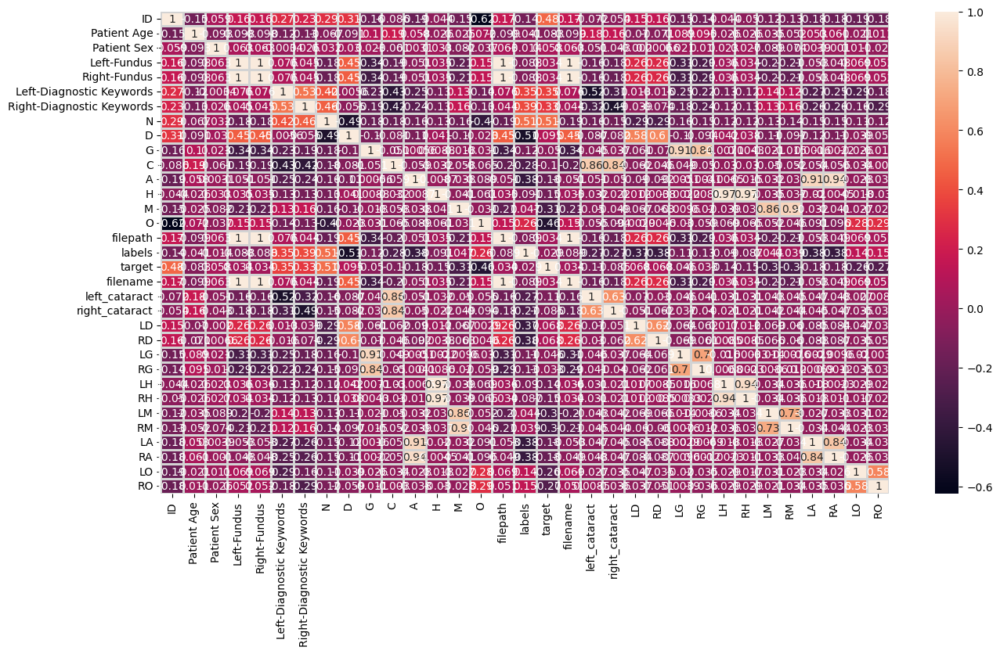

In [ ]:
plt.figure(figsize = (15,8))
sns.heatmap(fulldf.corr(), annot=True, linewidth=2, linecolor = 'lightgray')
plt.show()

In [ ]:
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from tqdm import tqdm
import cv2
import random

In [ ]:
dataset_dir = "/content/preprocessed_images"
image_size=224
labels = []
dataset = []
def data_gen(imagecategory , label):
    for img in tqdm(imagecategory):
        imgpath = os.path.join(dataset_dir,img);

        try:
            image = cv2.imread(imgpath,cv2.IMREAD_COLOR)
            image = cv2.resize(image,(image_size,image_size))
        except:
            continue;
        dataset.append([np.array(image),np.array(label)]);
    random.shuffle(dataset);

    return dataset;

In [ ]:
dataset = data_gen(normal,0)
dataset = data_gen(cataract,1)
dataset = data_gen(diab,2)
dataset = data_gen(glaucoma,3)
dataset = data_gen(hyper,4)
dataset = data_gen(myopia,5)
dataset = data_gen(age,6)
dataset = data_gen(other,7)

len(dataset)

100%|██████████| 324/324 [00:00<00:00, 498.08it/s]


5396

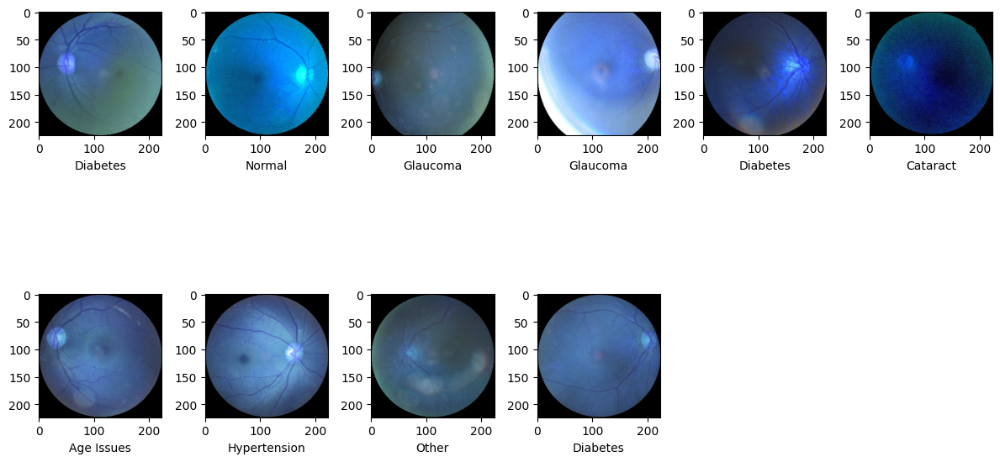

In [ ]:
plt.figure(figsize=(12,7))
for i in range(10):
    sample = random.choice(range(len(dataset)))
    image = dataset[sample][0]
    category = dataset[sample][1]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    plt.subplot(2,6,i+1)
    plt.imshow(image)
    plt.xlabel(label)
plt.tight_layout()

In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

train_x = np.array([i[0] for i in dataset]).reshape(-1,image_size,image_size,3);
train_y = np.array([i[1] for i in dataset])

x_train, x_temp, y_train, y_temp = train_test_split(train_x, train_y, test_size=0.2, random_state=42)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, random_state=42)


y_train_cat = to_categorical(y_train, num_classes=8)
y_val_cat = to_categorical(y_val, num_classes=8)
y_test_cat = to_categorical(y_test, num_classes=8)


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
idg = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=False,
    fill_mode='nearest'
)

idg_test = ImageDataGenerator(rescale=1./255)

In [ ]:
idg.fit(x_train)
idg.fit(x_val)
idg_test.fit(x_test)

#VGG19

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten,Dense,Dropout

In [ ]:
image_size = 224
vgg19 = VGG19(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
vgg19.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
for layer in vgg19.layers:
    layer.trainable = False

In [ ]:
count = 0
for layer in vgg19.layers:
  count = count +1
print(count)



22


In [ ]:
flat = tf.keras.layers.Flatten() (vgg19.output)
dense1 = tf.keras.layers.Dense(256, activation="relu") (flat)
dense2 = tf.keras.layers.Dense(256, activation="relu") (dense1)
output = tf.keras.layers.Dense(8, activation="softmax") (dense2)

In [ ]:
final_vgg19 = tf.keras.models.Model(inputs=[vgg19.input], outputs=[output])

In [ ]:
final_vgg19.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 26,515,016 (101.15 MB)

 Trainable params: 6,490,632 (24.76 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

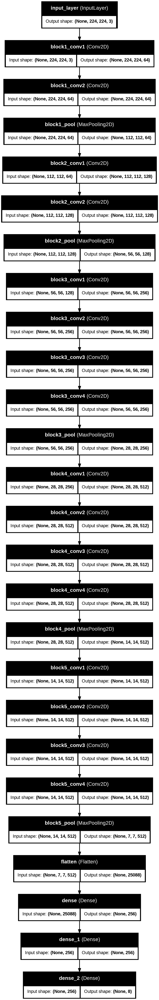

In [ ]:
tf.keras.utils.plot_model(final_vgg19, show_shapes = True, show_layer_names=True)

In [ ]:
final_vgg19.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
class_counts = np.bincount(y_train)
total_samples = np.sum(class_counts)
class_weights = total_samples / (len(class_counts) * class_counts)
class_weight = dict(enumerate(class_weights))


In [ ]:
train_data = (x_train, y_train_cat)
validation_data = (x_val, y_val_cat)
test_data = (x_test, y_test_cat)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping_callback = EarlyStopping(
    monitor='val_accuracy',
    patience=40,
    verbose = 1,
    restore_best_weights=True,
    mode = 'max'
)

In [ ]:
history = final_vgg19.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=30, class_weight=class_weight, callbacks=[early_stopping_callback])


Epoch 1/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 54s 287ms/step - accuracy: 0.3111 - loss: 14.9143 - val_accuracy: 0.5574 - val_loss: 1.5872
Epoch 2/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 56s 197ms/step - accuracy: 0.6045 - loss: 1.1216 - val_accuracy: 0.6111 - val_loss: 1.4379
Epoch 3/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 177ms/step - accuracy: 0.7444 - loss: 0.6415 - val_accuracy: 0.5963 - val_loss: 1.3991
Epoch 4/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 41s 179ms/step - accuracy: 0.7803 - loss: 0.5533 - val_accuracy: 0.6463 - val_loss: 1.3176
Epoch 5/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 41s 179ms/step - accuracy: 0.8190 - loss: 0.4568 - val_accuracy: 0.6537 - val_loss: 1.2978
Epoch 6/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 43s 196ms/step - accuracy: 0.8667 - loss: 0.3538 - val_accuracy: 0.7278 - val_loss: 1.0783
Epoch 7/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 41s 197ms/step - accuracy: 0.8595 - loss: 0.3262 - val_accuracy: 0.6333 - val_loss: 1.3717
Epoch 8/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 178ms/step - accuracy: 0.8664 - loss: 

In [ ]:
train_loss, train_accuracy = final_vgg19.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

val_loss, val_accuracy = final_vgg19.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_vgg19.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 95.71%
Validation Accuracy: 82.04%
Test Accuracy: 78.70%


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_vgg19.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step
[4, 5, 3, 0, 5, 2, 2, 6, 2, 4, 2, 2, 5, 2, 2, 2, 2, 1, 3, 2, 2, 2, 2, 2, 2, 1, 3, 2, 6, 0, 7, 4, 2, 0, 7, 2, 4, 2, 6, 5, 2, 4, 3, 2, 2, 2, 2, 5, 4, 2, 2, 1, 1, 2, 2, 0, 6, 2, 5, 0, 2, 4, 2, 1, 4, 3, 6, 0, 3, 2, 3, 0, 0, 6, 6, 0, 6, 5, 0, 4, 2, 2, 5, 6, 2, 3, 2, 1, 3, 3, 2, 2, 4, 6, 2, 6, 2, 2, 2, 5, 3, 2, 1, 3, 2, 4, 2, 5, 3, 2, 0, 2, 2, 2, 5, 5, 0, 6, 6, 3, 6, 4, 2, 5, 0, 5, 2, 1, 2, 3, 0, 6, 7, 3, 1, 7, 1, 0, 7, 2, 1, 3, 1, 1, 2, 6, 2, 5, 1, 2, 2, 5, 6, 5, 2, 5, 5, 0, 6, 5, 4, 2, 6, 5, 0, 3, 3, 2, 4, 2, 2, 1, 3, 3, 3, 7, 4, 2, 2, 1, 5, 4, 5, 2, 5, 3, 2, 2, 6, 2, 7, 6, 5, 7, 5, 5, 4, 1, 1, 2, 1, 2, 7, 3, 6, 2, 2, 2, 2, 7, 2, 5, 6, 3, 1, 5, 5, 7, 3, 4, 3, 2, 2, 1, 2, 2, 2, 6, 2, 2, 2, 2, 7, 7, 2, 0, 2, 0, 1, 7, 2, 6, 4, 1, 6, 2, 2, 3, 5, 1, 7, 2, 2, 2, 5, 3, 4, 1, 6, 6, 0, 3, 2, 4, 2, 2, 2, 7, 6, 2, 2, 5, 5, 0, 0, 2, 2, 3, 2, 5, 2, 2, 2, 2, 3, 2, 5, 3, 2, 3, 2, 5, 1, 6, 4, 4, 5, 2, 0, 2, 2, 1, 5, 5, 3, 2, 6, 2, 4, 4, 2, 2, 2, 5, 1, 5, 2, 2, 1, 3

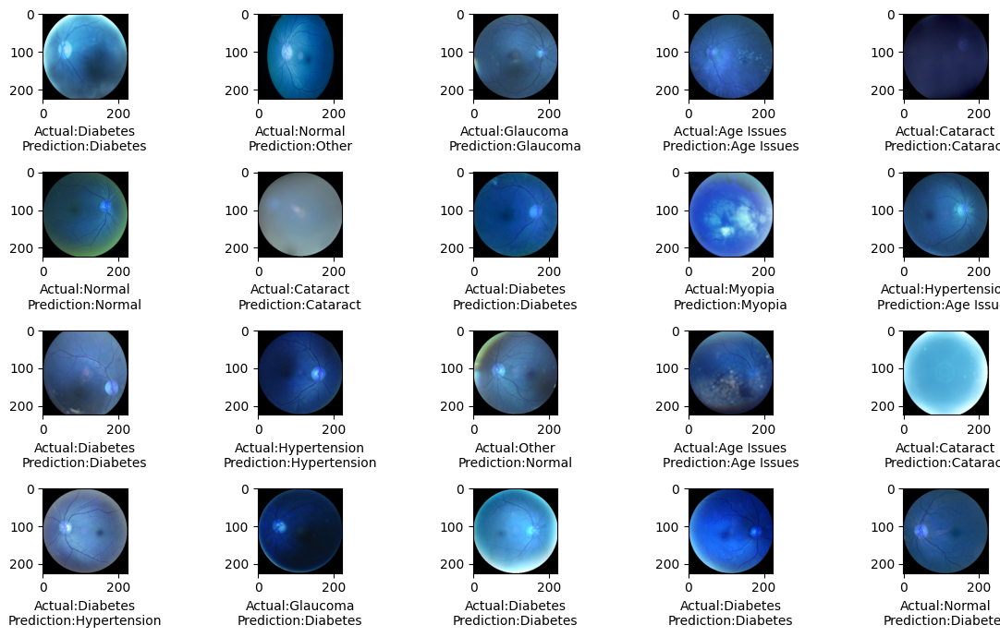

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_vgg19.save("ODIR_VGG19.h5")

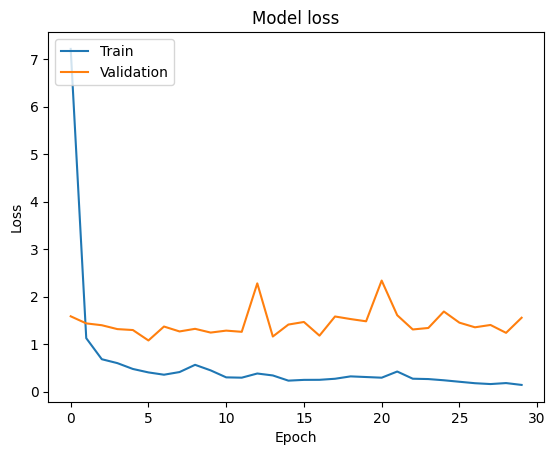

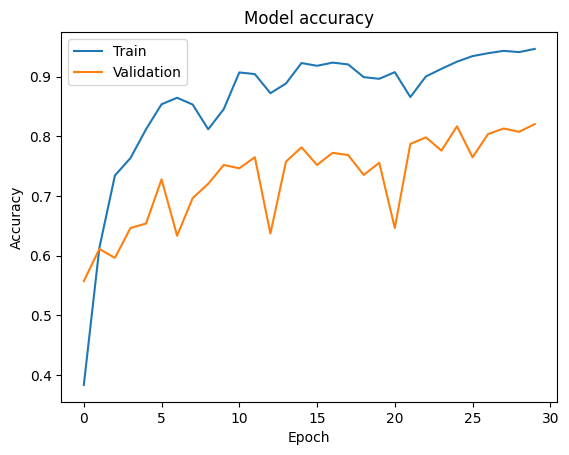

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_vgg19.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step
              precision    recall  f1-score   support

           0       0.58      0.41      0.48        68
           1       0.95      0.96      0.96        56
           2       0.81      0.82      0.82       188
           3       0.74      0.83      0.78        60
           4       0.59      0.76      0.67        34
           5       0.91      1.00      0.95        53
           6       0.76      0.78      0.77        54
           7       0.89      0.63      0.74        27

    accuracy                           0.79       540
   macro avg       0.78      0.78      0.77       540
weighted avg       0.78      0.79      0.78       540



# VGG16

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16

In [ ]:
input_shape = (224, 224, 3)
vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
vgg16.summary()


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
for layer in vgg16.layers:
    layer.trainable = False

In [ ]:
flat = tf.keras.layers.Flatten() (vgg16.output)
dense1 = tf.keras.layers.Dense(256, activation="relu") (flat)
dropout1 = Dropout(0.5)(dense1)
dense2 = tf.keras.layers.Dense(128, activation="relu") (dropout1)
dropout2 = Dropout(0.5)(dense2)
output = Dense(8, activation="softmax")(dropout2)

In [ ]:
final_vgg16 = tf.keras.models.Model(inputs=[vgg16.input], outputs=[output])

In [ ]:
final_vgg16.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 21,171,400 (80.76 MB)

 Trainable params: 6,456,712 (24.63 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
count = 0
for layer in final_vgg16.layers:
  count = count +1
print(count)



25


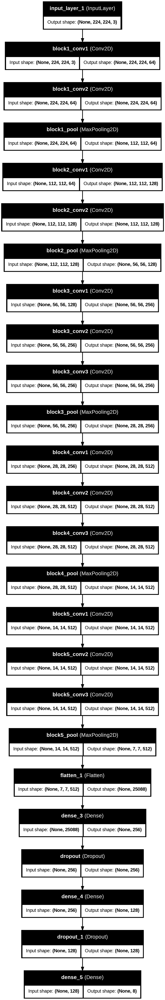

In [ ]:
tf.keras.utils.plot_model(final_vgg16, show_shapes = True, show_layer_names=True)

In [ ]:
from tensorflow.keras.optimizers import Adam
final_vgg16.compile(optimizer=Adam(learning_rate=1e-4),
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

In [ ]:
history = final_vgg16.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=30)


Epoch 1/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 186ms/step - accuracy: 0.3785 - loss: 1.9843 - val_accuracy: 0.4704 - val_loss: 1.7800
Epoch 2/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - accuracy: 0.4393 - loss: 1.8770 - val_accuracy: 0.5185 - val_loss: 1.6752
Epoch 3/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - accuracy: 0.4562 - loss: 1.7927 - val_accuracy: 0.5111 - val_loss: 1.6585
Epoch 4/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - accuracy: 0.4764 - loss: 1.7500 - val_accuracy: 0.5111 - val_loss: 1.6174
Epoch 5/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - accuracy: 0.4856 - loss: 1.6798 - val_accuracy: 0.5148 - val_loss: 1.5889
Epoch 6/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - accuracy: 0.4931 - loss: 1.6531 - val_accuracy: 0.5111 - val_loss: 1.5691
Epoch 7/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - accuracy: 0.4901 - loss: 1.6321 - val_accuracy: 0.5111 - val_loss: 1.5437
Epoch 8/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - accuracy: 0.5075 - loss: 1

In [ ]:
train_loss, train_accuracy = final_vgg16.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

val_loss, val_accuracy = final_vgg16.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_vgg16.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 58.48%
Validation Accuracy: 56.30%
Test Accuracy: 56.48%


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_vgg16.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step
[5, 1, 2, 2, 2, 2, 2, 3, 3, 2, 2, 3, 5, 2, 1, 2, 2, 2, 1, 2, 2, 3, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 5, 2, 5, 2, 2, 2, 2, 2, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 5, 2, 2, 2, 2, 2, 2, 3, 3, 2, 2, 5, 2, 5, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 1, 2, 2, 5, 1, 2, 2, 2, 2, 5, 2, 2, 1, 3, 2, 5, 1, 3, 3, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 3, 2, 2, 2, 2, 2, 2, 3, 2, 1, 5, 3, 2, 2, 2, 1, 2, 2, 5, 2, 5, 2, 2, 2, 2, 5, 2, 2, 2, 2, 2, 2, 2, 2, 5, 2, 2, 2, 2, 2, 2, 3, 2, 3, 3, 2, 2, 2, 2, 2, 2, 2, 3, 2, 3, 2, 1, 2, 1, 3, 2, 5, 1, 3, 5, 2, 2, 2, 2, 1, 2, 2, 2, 3, 1, 2, 2, 2, 2, 2, 3, 1, 5, 5, 5, 2, 2, 3, 5, 2, 2, 5, 1, 2, 3, 2, 2, 1, 2, 2, 2, 2, 2, 2, 3, 2, 2, 5, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 3, 3, 2, 2, 2, 1, 5, 2, 5, 2, 2, 2, 5, 2, 2, 2, 2, 2, 3, 2, 1, 2, 2, 2, 2, 5, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2

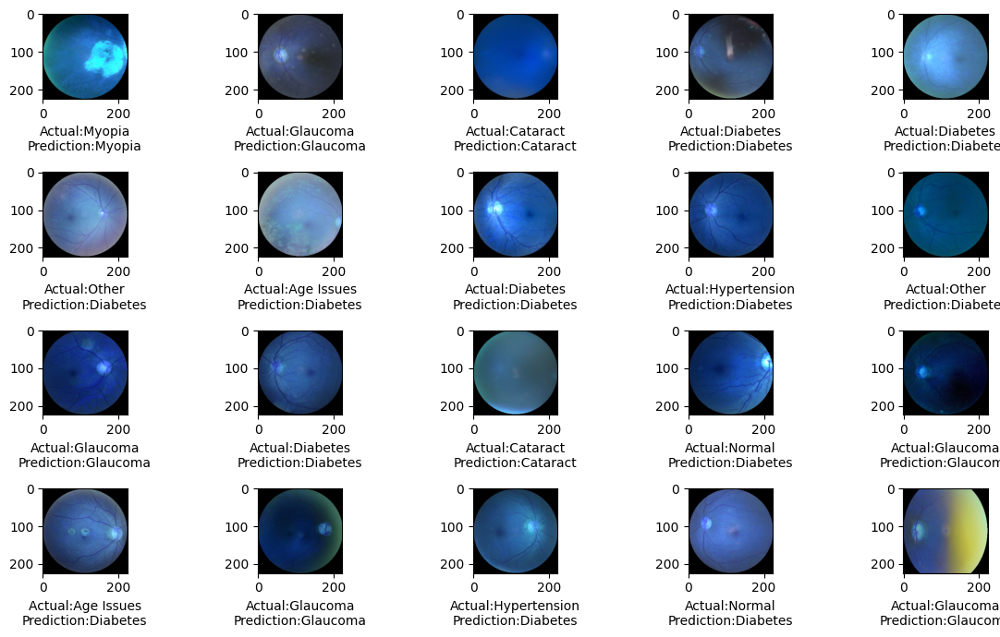

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_vgg16.save("ODIR_VGG16.h5")

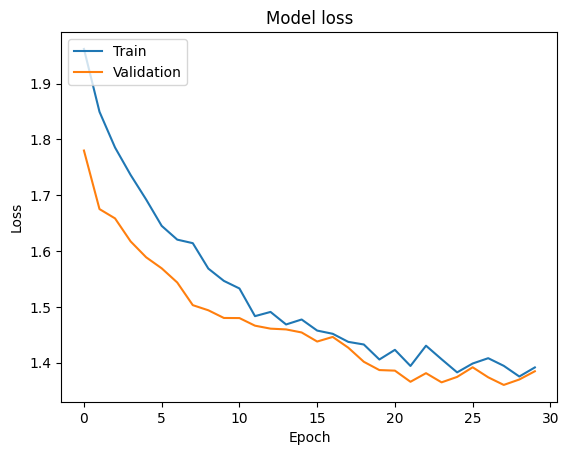

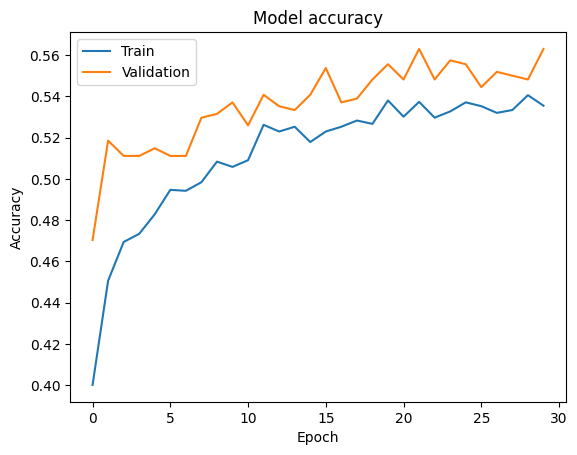

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_vgg16.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 134ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        65
           1       0.94      0.85      0.89        59
           2       0.45      0.99      0.62       176
           3       0.77      0.56      0.65        61
           4       0.00      0.00      0.00        42
           5       0.81      0.96      0.88        49
           6       0.00      0.00      0.00        50
           7       0.00      0.00      0.00        38

    accuracy                           0.56       540
   macro avg       0.37      0.42      0.38       540
weighted avg       0.41      0.56      0.45       540



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Resnet 34

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms

In [ ]:
resnet34 = models.resnet34(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
num_features = resnet34.fc.in_features
resnet34.fc = nn.Linear(num_features, 8)

In [ ]:
print(resnet34)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet34.parameters(), lr=1e-4)

In [ ]:
from torchvision import datasets

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])



In [ ]:
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms

from PIL import Image

class OcularDataset(Dataset):
    def __init__(self, data, labels, transform=None):
        self.data = data
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):

        image = Image.fromarray(self.data[idx].astype('uint8'))

        if self.transform:
            image = self.transform(image)

        label = self.labels[idx]
        if len(label.shape) > 1 and label.shape[-1] > 1:
            label = torch.argmax(torch.tensor(label), dim=-1)
        else:
            label = torch.tensor(label)

        return image, label

train_dataset = OcularDataset(data=x_train, labels=y_train_cat, transform=transform)
val_dataset = OcularDataset(data=x_val, labels=y_val_cat, transform=transform)
test_dataset = OcularDataset(data=x_test, labels=y_test_cat, transform=transform)


train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet34 = resnet34.to(device)

In [ ]:
num_epochs = 30
for epoch in range(num_epochs):
    resnet34.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = resnet34(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader)}')

    resnet34.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)

            if len(labels.shape) > 1 and labels.shape[-1] > 1:
                labels = torch.argmax(labels, dim=1)

            outputs = resnet34(images)
            _, predicted = torch.max(outputs.data, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        print(f'Validation Accuracy: {100 * correct / total}%')

torch.save(resnet34.state_dict(), 'resnet34_ocular.pth')


Epoch [1/30], Loss: 0.602627588231851
Validation Accuracy: 77.03703703703704%
Epoch [2/30], Loss: 0.32241018397252635
Validation Accuracy: 82.77777777777777%
Epoch [3/30], Loss: 0.20909320030816214
Validation Accuracy: 80.18518518518519%
Epoch [4/30], Loss: 0.1673765951757807
Validation Accuracy: 82.5925925925926%
Epoch [5/30], Loss: 0.12086233415437254
Validation Accuracy: 84.81481481481481%
Epoch [6/30], Loss: 0.12896864932080074
Validation Accuracy: 80.55555555555556%
Epoch [7/30], Loss: 0.14977115020662388
Validation Accuracy: 82.5925925925926%
Epoch [8/30], Loss: 0.13272950015596366
Validation Accuracy: 81.85185185185185%
Epoch [9/30], Loss: 0.12323771572959046
Validation Accuracy: 82.22222222222223%
Epoch [10/30], Loss: 0.08834344118964814
Validation Accuracy: 83.14814814814815%
Epoch [11/30], Loss: 0.10087458047229458
Validation Accuracy: 79.81481481481481%
Epoch [12/30], Loss: 0.11603786756785865
Validation Accuracy: 79.81481481481481%
Epoch [13/30], Loss: 0.11632717639461104
V

In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        if len(labels.shape) > 1 and labels.shape[-1] > 1:
            labels = torch.argmax(labels, dim=1)

        outputs = resnet34(images)
        _, predicted = torch.max(outputs.data, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Test Accuracy: {100 * correct / total}%')


Test Accuracy: 83.70370370370371%


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import random
import numpy as np

In [ ]:
resnet34.eval()

y_pred = []
y_true = []

In [ ]:
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = resnet34(images)
        _, predicted = torch.max(outputs.data, 1)


        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())


In [ ]:
y_pred = np.array(y_pred)
y_true = np.array(y_true)

In [ ]:
if len(y_true.shape) > 1 and y_true.shape[1] > 1:
    y_true = np.argmax(y_true, axis=1)

In [ ]:
print("Accuracy Score:", accuracy_score(y_true, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_true, y_pred))
print("Classification Report:")
print(classification_report(y_true, y_pred))

Accuracy Score: 0.837037037037037
Confusion Matrix:
[[ 39   1  11   8   3   1   2   0]
 [  1  56   0   2   0   0   0   0]
 [ 11   0 156   2   2   1   1   3]
 [  0   0   1  54   2   3   1   0]
 [  3   0  10   1  22   0   5   1]
 [  0   0   0   1   0  48   0   0]
 [  2   0   2   0   0   2  43   1]
 [  0   0   1   2   0   0   1  34]]
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.60      0.64        65
           1       0.98      0.95      0.97        59
           2       0.86      0.89      0.87       176
           3       0.77      0.89      0.82        61
           4       0.76      0.52      0.62        42
           5       0.87      0.98      0.92        49
           6       0.81      0.86      0.83        50
           7       0.87      0.89      0.88        38

    accuracy                           0.84       540
   macro avg       0.83      0.82      0.82       540
weighted avg       0.83      0.84      0.83     

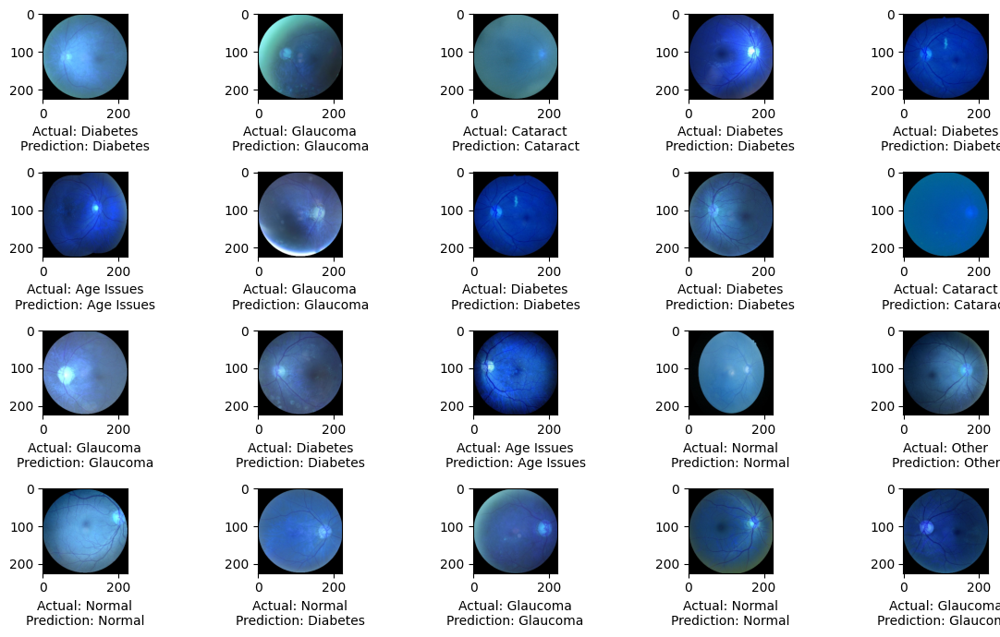

In [ ]:

import random


def visualize_samples(x_data, y_true, y_pred, labels, num_samples=20):
    plt.figure(figsize=(12, 7))
    for i in range(num_samples):
        sample = random.choice(range(len(x_data)))
        image = x_data[sample]

        if isinstance(image, torch.Tensor):
            image = image.cpu().numpy()


        if image.ndim == 3 and image.shape[0] == 3:
            image = np.transpose(image, (1, 2, 0))

        if image.max() > 1:
            image = (image - image.min()) / (image.max() - image.min())  # Normalize to [0, 1]

        category = y_true[sample]
        pred_category = y_pred[sample]

        label = labels[category]
        pred_label = labels[pred_category]

        plt.subplot(4, 5, i + 1)
        plt.imshow(image)
        plt.xlabel(f"Actual: {label}\nPrediction: {pred_label}")

    plt.tight_layout()
    plt.show()

# Define labels
labels = ["Normal", "Cataract", "Diabetes", "Glaucoma", "Hypertension", "Myopia", "Age Issues", "Other"]

# Assuming y_true and y_pred are numpy arrays of true and predicted labels
visualize_samples(x_test, y_true, y_pred, labels)


# Resnet 50

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras import layers, models

In [ ]:
image_size = 224
resnet50 = ResNet50(weights="imagenet", include_top=False, input_shape=(image_size, image_size, 3))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
for layer in resnet50.layers:
    layer.trainable = False

In [ ]:
resnet50.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
n_inputs = resnet50.output_shape[1]

In [ ]:
flat = layers.Flatten()(resnet50.output)
dense1 = layers.Dense(2048, activation="relu")(flat)
dropout1 = layers.Dropout(0.4)(dense1)
dense2 = layers.Dense(2048, activation="relu")(dropout1)
dropout2 = layers.Dropout(0.4)(dense2)
output = layers.Dense(8, activation="softmax")(dropout2)

In [ ]:
final_resnet50 = tf.keras.models.Model(inputs=[resnet50.input], outputs=[output])

In [ ]:
final_resnet50.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 233,323,400 (890.06 MB)

 Trainable params: 209,735,688 (800.08 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
count = 0
for layer in final_resnet50.layers:
  count = count +1
print(count)



181


In [ ]:
from tensorflow.keras.optimizers import SGD

In [ ]:
final_resnet50.compile(optimizer=SGD(learning_rate=3e-4, momentum=0.9),
              loss="categorical_crossentropy",
              metrics=['accuracy'])

In [ ]:
history = final_resnet50.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=50, class_weight=class_weight)


Epoch 1/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - accuracy: 0.8490 - loss: 0.3096 - val_accuracy: 0.6796 - val_loss: 0.8562
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - accuracy: 0.8449 - loss: 0.3111 - val_accuracy: 0.6741 - val_loss: 0.9635
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - accuracy: 0.8317 - loss: 0.3110 - val_accuracy: 0.7611 - val_loss: 0.7362
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - accuracy: 0.8629 - loss: 0.2778 - val_accuracy: 0.7870 - val_loss: 0.6945
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - accuracy: 0.8701 - loss: 0.2787 - val_accuracy: 0.7759 - val_loss: 0.7572
Epoch 6/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - accuracy: 0.8777 - loss: 0.2649 - val_accuracy: 0.7833 - val_loss: 0.6692
Epoch 7/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - accuracy: 0.8694 - loss: 0.2582 - val_accuracy: 0.7778 - val_loss: 0.7488
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - accuracy: 0.8729 - loss: 0

In [ ]:
train_loss, train_accuracy = final_resnet50.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

val_loss, val_accuracy = final_resnet50.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_resnet50.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 96.55%
Validation Accuracy: 79.63%
Test Accuracy: 82.04%


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_resnet50.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step
[7, 2, 3, 2, 2, 6, 2, 4, 1, 4, 1, 2, 2, 1, 6, 2, 0, 5, 2, 1, 2, 6, 2, 7, 1, 2, 6, 2, 5, 7, 1, 2, 1, 3, 1, 1, 7, 2, 1, 6, 5, 2, 2, 1, 2, 2, 2, 6, 6, 2, 6, 4, 6, 5, 2, 6, 0, 3, 7, 4, 2, 6, 2, 1, 3, 6, 0, 1, 3, 6, 4, 2, 2, 5, 2, 1, 5, 2, 0, 1, 1, 6, 2, 7, 4, 6, 1, 6, 5, 4, 2, 2, 2, 2, 2, 7, 1, 5, 2, 3, 3, 2, 0, 7, 7, 2, 2, 0, 2, 3, 1, 7, 2, 2, 6, 6, 2, 2, 4, 7, 2, 3, 6, 4, 0, 2, 2, 2, 3, 2, 1, 6, 3, 3, 3, 2, 6, 2, 0, 4, 1, 5, 2, 0, 2, 2, 5, 7, 2, 2, 1, 2, 2, 0, 2, 1, 3, 2, 2, 2, 1, 0, 6, 2, 1, 2, 1, 2, 2, 2, 2, 2, 5, 6, 7, 2, 2, 7, 3, 2, 7, 1, 2, 3, 2, 2, 4, 2, 2, 1, 2, 2, 0, 2, 0, 1, 3, 5, 3, 5, 2, 2, 6, 7, 2, 1, 3, 5, 3, 7, 2, 2, 1, 5, 0, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 0, 3, 7, 6, 4, 6, 4, 3, 5, 3, 2, 5, 5, 4, 4, 0, 1, 2, 3, 2, 4, 2, 2, 4, 6, 1, 2, 5, 2, 2, 4, 0, 6, 0, 1, 3, 4, 2, 1, 3, 2, 4, 2, 4, 0, 1, 1, 1, 2, 2, 0, 3, 6, 2, 2, 5, 0, 2, 4, 6, 0, 7, 2, 5, 3, 2, 2, 5, 2, 4, 2, 3, 3, 4, 2, 6, 0, 6, 3, 5, 2, 2, 6, 2, 5, 1, 3, 4, 6, 1, 3, 0, 2, 1, 2,

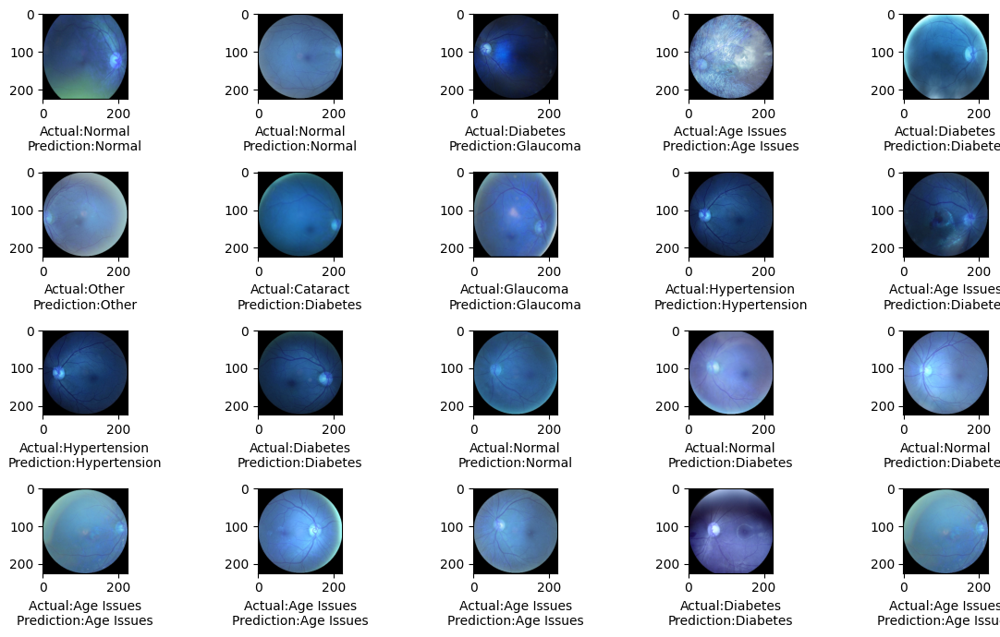

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_resnet50.save("ODIR_resnet50.h5")

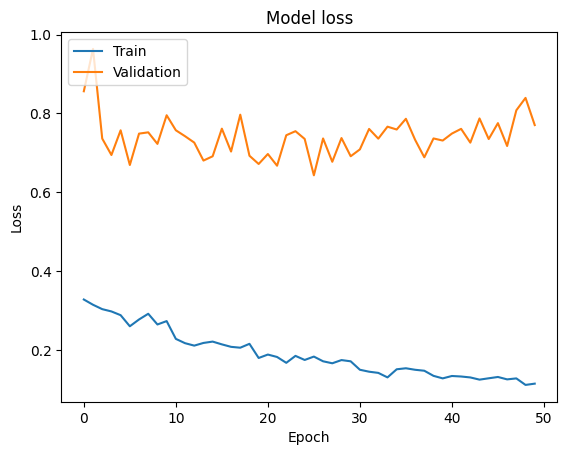

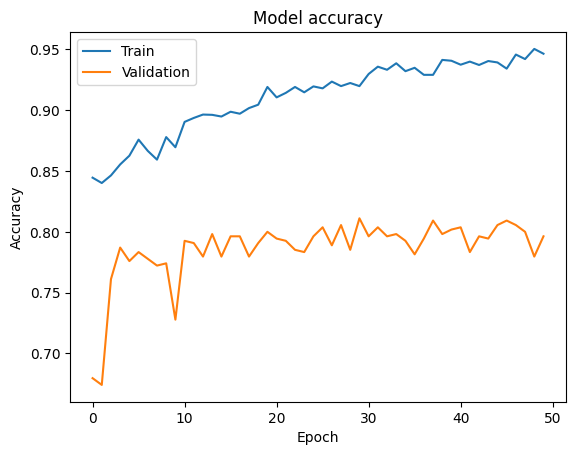

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_resnet50.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step
              precision    recall  f1-score   support

           0       0.69      0.53      0.60        62
           1       0.88      0.96      0.92        53
           2       0.82      0.85      0.84       179
           3       0.77      0.75      0.76        63
           4       0.69      0.86      0.77        42
           5       0.96      1.00      0.98        43
           6       0.96      0.78      0.86        67
           7       0.78      0.94      0.85        31

    accuracy                           0.82       540
   macro avg       0.82      0.83      0.82       540
weighted avg       0.82      0.82      0.82       540



# Efficient Net

In [ ]:
from tensorflow.keras.applications import EfficientNetB0

In [ ]:
efficientnet = EfficientNetB0(weights="imagenet", include_top=False, input_shape=(image_size, image_size, 3))

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
for layer in efficientnet.layers:
    layer.trainable = True

In [ ]:
efficientnet.summary()

Model: "efficientnetb0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 4,007,548 (15.29 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [ ]:
flat = layers.Flatten()(efficientnet.output)
dense1 = layers.Dense(2048, activation="relu")(flat)
dropout1 = layers.Dropout(0.4)(dense1)
dense2 = layers.Dense(2048, activation="relu")(dropout1)
dropout2 = layers.Dropout(0.4)(dense2)
output = layers.Dense(8, activation="softmax")(dropout2)

In [ ]:
final_efficient = tf.keras.models.Model(inputs=[efficientnet.input], outputs=[output])

In [ ]:
final_efficient.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 136,714,923 (521.53 MB)

 Trainable params: 136,672,900 (521.37 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [ ]:
count = 0
for layer in final_efficient.layers:
  count = count +1
print(count)



244


In [ ]:
final_efficient.compile(optimizer=SGD(learning_rate=3e-4, momentum=0.9),
              loss="categorical_crossentropy",
              metrics=['accuracy'])

In [ ]:
history = final_efficient.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=30, class_weight=class_weight)


Epoch 1/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 205s 723ms/step - accuracy: 0.2420 - loss: 2.2356 - val_accuracy: 0.2796 - val_loss: 1.8273
Epoch 2/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 61s 145ms/step - accuracy: 0.4798 - loss: 1.2846 - val_accuracy: 0.3463 - val_loss: 1.7193
Epoch 3/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - accuracy: 0.5902 - loss: 0.9766 - val_accuracy: 0.5796 - val_loss: 1.1433
Epoch 4/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - accuracy: 0.6637 - loss: 0.7610 - val_accuracy: 0.6593 - val_loss: 0.9918
Epoch 5/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - accuracy: 0.7325 - loss: 0.6091 - val_accuracy: 0.6870 - val_loss: 0.9027
Epoch 6/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - accuracy: 0.7828 - loss: 0.4907 - val_accuracy: 0.7185 - val_loss: 0.8018
Epoch 7/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - accuracy: 0.7974 - loss: 0.4401 - val_accuracy: 0.7574 - val_loss: 0.7629
Epoch 8/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - accuracy: 0.8367 - loss: 

In [ ]:
train_loss, train_accuracy = final_efficient.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

val_loss, val_accuracy = final_efficient.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_efficient.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 96.59%
Validation Accuracy: 81.48%
Test Accuracy: 82.96%


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_efficient.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

17/17 ━━━━━━━━━━━━━━━━━━━━ 14s 384ms/step
[7, 2, 3, 2, 2, 6, 2, 4, 1, 4, 1, 2, 2, 1, 6, 2, 2, 5, 2, 1, 2, 6, 2, 7, 1, 2, 6, 2, 5, 7, 1, 2, 1, 3, 1, 1, 7, 2, 1, 6, 5, 2, 2, 1, 2, 2, 2, 6, 6, 2, 6, 4, 6, 1, 2, 6, 0, 3, 7, 4, 2, 2, 2, 1, 3, 6, 0, 1, 3, 6, 4, 2, 2, 5, 1, 1, 5, 2, 0, 1, 1, 6, 2, 0, 4, 6, 1, 6, 5, 4, 2, 2, 2, 4, 2, 7, 1, 5, 2, 2, 3, 7, 2, 7, 7, 2, 2, 0, 2, 3, 1, 7, 2, 2, 6, 6, 2, 2, 4, 7, 2, 3, 6, 4, 7, 0, 2, 2, 3, 2, 1, 6, 3, 3, 3, 2, 6, 2, 0, 4, 1, 5, 2, 7, 2, 0, 5, 7, 6, 2, 1, 2, 2, 0, 2, 1, 3, 2, 2, 2, 1, 0, 6, 2, 1, 2, 1, 2, 2, 2, 2, 2, 5, 6, 7, 2, 2, 7, 3, 2, 7, 1, 2, 3, 2, 2, 4, 2, 2, 1, 2, 2, 0, 2, 0, 3, 3, 5, 3, 5, 2, 2, 6, 7, 2, 2, 3, 5, 3, 7, 2, 2, 1, 5, 0, 2, 2, 2, 1, 1, 2, 2, 0, 2, 2, 3, 3, 2, 6, 4, 6, 4, 3, 5, 3, 2, 5, 5, 4, 4, 0, 1, 2, 3, 0, 4, 2, 2, 4, 2, 1, 2, 5, 2, 2, 4, 7, 6, 0, 1, 3, 4, 2, 1, 3, 2, 4, 0, 4, 0, 1, 1, 1, 2, 2, 6, 3, 6, 2, 2, 5, 0, 2, 2, 6, 0, 7, 2, 5, 3, 2, 2, 5, 2, 4, 2, 3, 3, 4, 3, 6, 0, 6, 3, 3, 2, 0, 6, 2, 5, 1, 3, 4, 6, 1, 3, 0, 2, 1, 

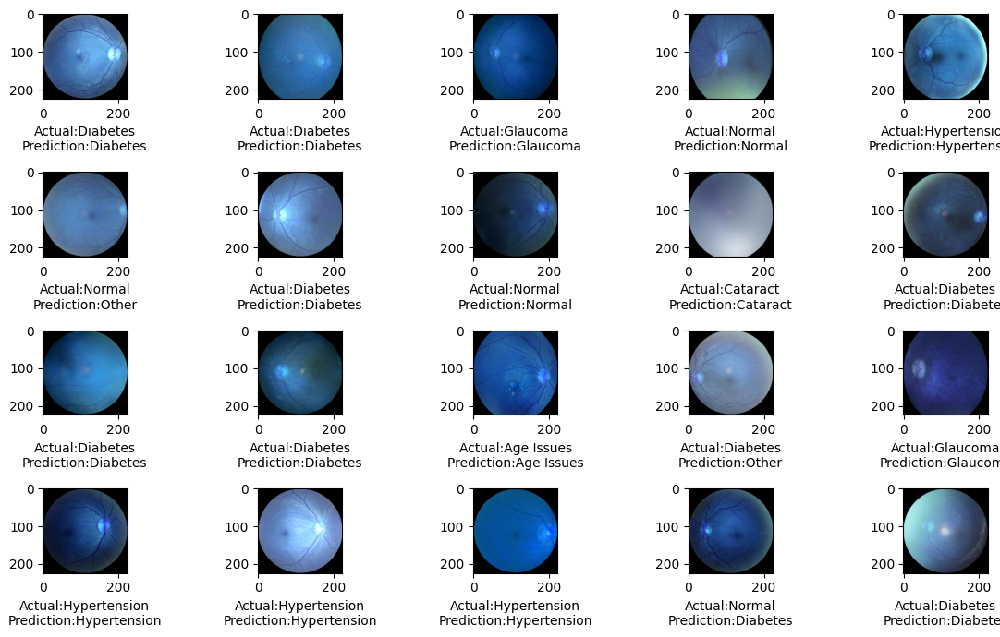

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_efficient.save("ODIR_efficient.h5")

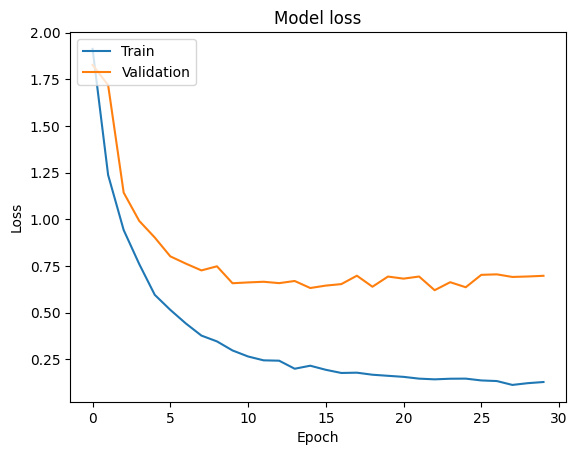

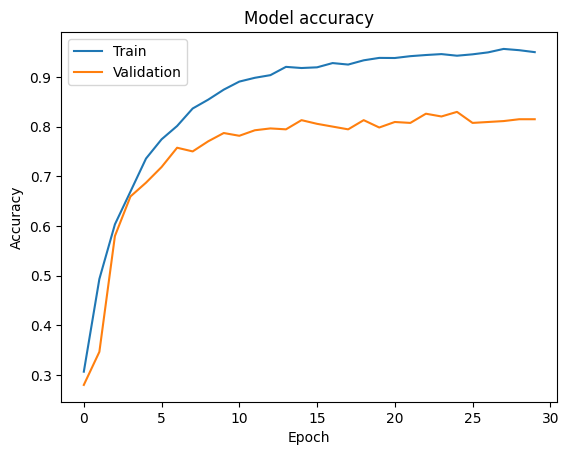

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_efficient.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step
              precision    recall  f1-score   support

           0       0.70      0.53      0.61        62
           1       0.91      1.00      0.95        53
           2       0.85      0.86      0.86       179
           3       0.81      0.89      0.85        63
           4       0.72      0.86      0.78        42
           5       0.98      0.93      0.95        43
           6       0.93      0.75      0.83        67
           7       0.65      0.84      0.73        31

    accuracy                           0.83       540
   macro avg       0.82      0.83      0.82       540
weighted avg       0.83      0.83      0.83       540



# Xception

In [ ]:
from tensorflow.keras.applications.xception import Xception
image_size = 224


In [ ]:
xception = Xception(weights="imagenet", include_top=False, input_shape=(image_size, image_size, 3))

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
for layer in xception.layers:
    layer.trainable = True


In [ ]:
n_inputs = xception.output_shape[1]

In [ ]:
xception.summary()

Model: "xception"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 111, 111, 32)   │            864 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 111, 111, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 111, 111, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 109, 109, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 109, 109, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 109, 109, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 109, 109, 128)  │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 109, 109, 128)  │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 109, 109, 128)  │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 109, 109, 128)  │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 109, 109, 128)  │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 55, 55, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 55, 55, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 20,861,480 (79.58 MB)

 Trainable params: 20,806,952 (79.37 MB)

 Non-trainable params: 54,528 (213.00 KB)

In [ ]:
from tensorflow.keras import layers
import tensorflow as tf

flat = layers.Flatten()(xception.output)
dense1 = layers.Dense(2048, activation="relu")(flat)
dropout1 = layers.Dropout(0.4)(dense1)
dense2 = layers.Dense(2048, activation="relu")(dropout1)
dropout2 = layers.Dropout(0.4)(dense2)
output = layers.Dense(8, activation="softmax")(dropout2)

In [ ]:
final_xception = tf.keras.models.Model(inputs=[xception.input], outputs=[output])

In [ ]:
final_xception.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 111, 111, 32)   │            864 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 111, 111, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 111, 111, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 109, 109, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 109, 109, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 109, 109, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 109, 109, 128)  │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 109, 109, 128)  │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 109, 109, 128)  │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 109, 109, 128)  │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 109, 109, 128)  │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 55, 55, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 55, 55, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 230,597,168 (879.66 MB)

 Trainable params: 230,542,640 (879.45 MB)

 Non-trainable params: 54,528 (213.00 KB)

In [ ]:
count = 0
for layer in final_xception.layers:
  count = count +1
print(count)



138


In [ ]:
for layer in final_xception.layers:
    # Check if the layer has an 'output_shape' attribute
    output_shape = getattr(layer, 'output_shape', 'N/A')
    print(f"Layer Name: {layer.name}")

Layer Name: input_layer_2
Layer Name: block1_conv1
Layer Name: block1_conv1_bn
Layer Name: block1_conv1_act
Layer Name: block1_conv2
Layer Name: block1_conv2_bn
Layer Name: block1_conv2_act
Layer Name: block2_sepconv1
Layer Name: block2_sepconv1_bn
Layer Name: block2_sepconv2_act
Layer Name: block2_sepconv2
Layer Name: block2_sepconv2_bn
Layer Name: conv2d_6
Layer Name: block2_pool
Layer Name: batch_normalization_6
Layer Name: add
Layer Name: block3_sepconv1_act
Layer Name: block3_sepconv1
Layer Name: block3_sepconv1_bn
Layer Name: block3_sepconv2_act
Layer Name: block3_sepconv2
Layer Name: block3_sepconv2_bn
Layer Name: conv2d_7
Layer Name: block3_pool
Layer Name: batch_normalization_7
Layer Name: add_1
Layer Name: block4_sepconv1_act
Layer Name: block4_sepconv1
Layer Name: block4_sepconv1_bn
Layer Name: block4_sepconv2_act
Layer Name: block4_sepconv2
Layer Name: block4_sepconv2_bn
Layer Name: conv2d_8
Layer Name: block4_pool
Layer Name: batch_normalization_8
Layer Name: add_2
Layer N

In [ ]:
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.losses import SparseCategoricalCrossentropy
final_xception.compile(optimizer=SGD(learning_rate=3e-4, momentum=0.9),
              loss="categorical_crossentropy",
              metrics=['accuracy'])

In [ ]:
history = final_xception.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=30, class_weight=class_weight)


Epoch 1/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 147s 737ms/step - accuracy: 0.2336 - loss: 1.9164 - val_accuracy: 0.3944 - val_loss: 1.5247
Epoch 2/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 70s 440ms/step - accuracy: 0.4827 - loss: 1.2807 - val_accuracy: 0.5389 - val_loss: 1.1862
Epoch 3/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 81s 433ms/step - accuracy: 0.5813 - loss: 0.9831 - val_accuracy: 0.5963 - val_loss: 1.0927
Epoch 4/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 83s 439ms/step - accuracy: 0.6617 - loss: 0.7911 - val_accuracy: 0.6204 - val_loss: 1.0464
Epoch 5/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 82s 440ms/step - accuracy: 0.7346 - loss: 0.5803 - val_accuracy: 0.6981 - val_loss: 0.8622
Epoch 6/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 82s 438ms/step - accuracy: 0.7834 - loss: 0.4586 - val_accuracy: 0.7704 - val_loss: 0.7460
Epoch 7/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 82s 439ms/step - accuracy: 0.8344 - loss: 0.3742 - val_accuracy: 0.7370 - val_loss: 0.7987
Epoch 8/30
135/135 ━━━━━━━━━━━━━━━━━━━━ 81s 434ms/step - accuracy: 0.8705 - loss: 

In [ ]:
train_loss, train_accuracy = final_xception.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")
print("Training Loss:",train_loss)

val_loss, val_accuracy = final_xception.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_xception.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
print("Test Loss:",test_loss)


Training Accuracy: 96.59%
Training Loss: 0.08468137681484222
Validation Accuracy: 82.22%
Test Accuracy: 82.78%
Test Loss: 0.7981017231941223


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_xception.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

17/17 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step
[4, 3, 2, 3, 2, 2, 5, 2, 0, 3, 2, 1, 4, 5, 0, 2, 2, 2, 6, 6, 2, 7, 1, 0, 1, 2, 2, 2, 0, 7, 3, 7, 3, 5, 3, 3, 0, 3, 6, 2, 4, 1, 3, 0, 1, 3, 2, 2, 2, 3, 6, 0, 6, 6, 5, 1, 2, 0, 0, 4, 5, 3, 3, 2, 4, 4, 2, 3, 1, 2, 2, 0, 2, 2, 5, 0, 5, 5, 2, 0, 2, 5, 2, 0, 2, 1, 6, 2, 3, 2, 5, 6, 0, 3, 4, 0, 2, 6, 3, 6, 4, 3, 3, 3, 2, 1, 2, 4, 7, 3, 4, 3, 2, 5, 3, 7, 2, 2, 5, 4, 1, 6, 1, 5, 2, 0, 2, 7, 7, 2, 6, 2, 3, 1, 5, 1, 2, 2, 2, 2, 1, 2, 3, 3, 2, 1, 6, 5, 3, 7, 1, 4, 1, 5, 2, 2, 2, 6, 2, 5, 1, 2, 4, 2, 6, 1, 3, 2, 2, 1, 4, 7, 4, 0, 6, 2, 1, 5, 2, 1, 2, 4, 5, 3, 1, 1, 6, 2, 7, 2, 1, 2, 3, 0, 0, 0, 2, 2, 1, 6, 4, 4, 4, 2, 1, 7, 5, 2, 0, 4, 4, 6, 6, 7, 2, 3, 5, 2, 3, 4, 1, 0, 7, 4, 2, 6, 5, 4, 0, 2, 2, 4, 6, 3, 6, 0, 3, 2, 5, 2, 2, 3, 6, 4, 2, 2, 1, 5, 2, 2, 2, 2, 5, 3, 1, 0, 3, 2, 2, 3, 3, 2, 4, 6, 5, 5, 3, 7, 2, 2, 1, 2, 1, 5, 0, 2, 6, 3, 3, 3, 3, 0, 3, 2, 1, 2, 6, 2, 3, 0, 4, 3, 5, 6, 2, 2, 5, 0, 4, 5, 2, 3, 2, 6, 0, 5, 7, 1, 1, 2, 3, 1, 7, 2, 1, 3, 2, 1, 5, 2

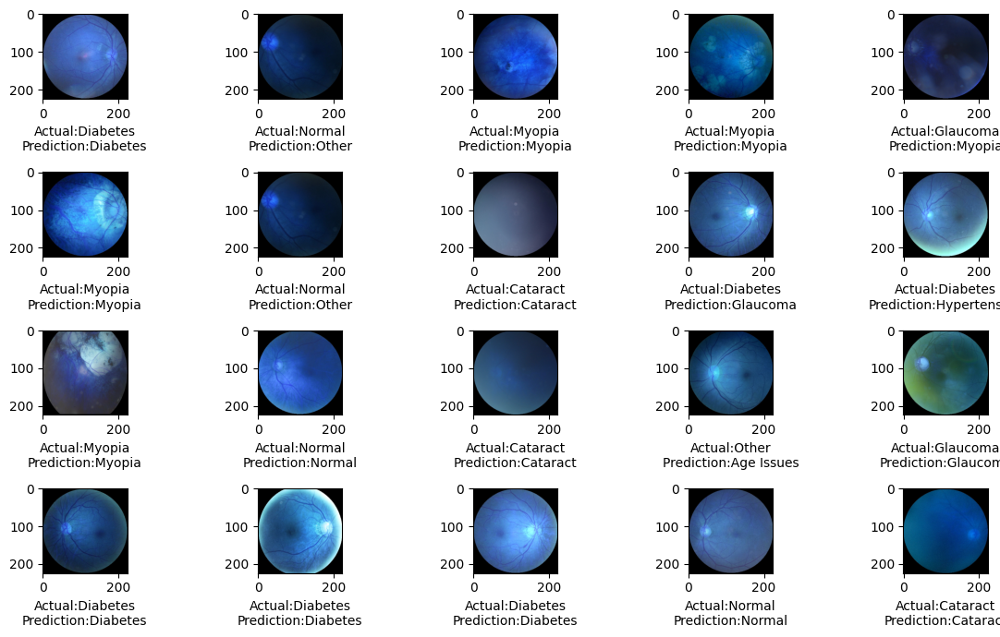

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_xception.save("ODIR_Xception.h5")

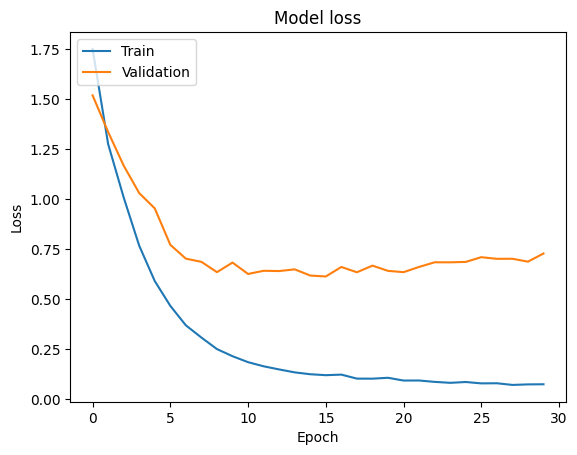

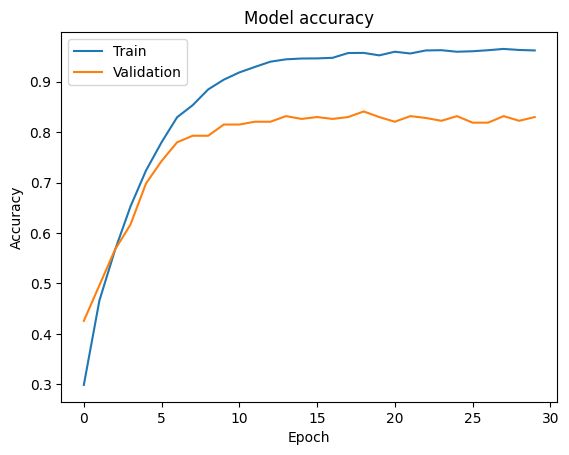

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_xception.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step
              precision    recall  f1-score   support

           0       0.75      0.55      0.64        65
           1       0.92      0.93      0.93        61
           2       0.88      0.82      0.85       174
           3       0.68      0.81      0.74        64
           4       0.65      0.86      0.74        37
           5       0.86      0.93      0.89        54
           6       0.76      0.86      0.81        51
           7       0.88      0.68      0.77        34

    accuracy                           0.81       540
   macro avg       0.80      0.81      0.79       540
weighted avg       0.81      0.81      0.81       540



In [ ]:
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score, matthews_corrcoef
import time

print(confusion_matrix(y_true_classes, y_pred_classes).ravel())

[ 21   3  24   6   6   1   3   1   3  55   3   0   0   0   0   0   6   0
 142   6  12   3   1   4   0   1   0  52   1   4   5   1   2   0   2   0
  30   0   3   0   0   0   1   1   0  51   1   0   0   1   3   4   1   1
  41   0   2   0   1   3   1   0   2  25]


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, matthews_corrcoef

# Assuming y_true_classes and y_pred_classes are your true and predicted labels
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)

# Calculate per-class metrics
precision = precision_score(y_true_classes, y_pred_classes, average=None)
recall = recall_score(y_true_classes, y_pred_classes, average=None)
f1 = f1_score(y_true_classes, y_pred_classes, average=None)
mcc = matthews_corrcoef(y_true_classes, y_pred_classes)

# For specificity, we need to compute it manually
specificity = []
for i in range(conf_matrix.shape[0]):
    # True Negatives: sum all elements except the ith row and ith column
    tn = np.sum(np.delete(np.delete(conf_matrix, i, axis=0), i, axis=1))
    # False Positives: sum the ith column except the diagonal
    fp = np.sum(conf_matrix[:, i]) - conf_matrix[i, i]
    # False Negatives: sum the ith row except the diagonal
    fn = np.sum(conf_matrix[i, :]) - conf_matrix[i, i]
    # True Positives: diagonal element
    tp = conf_matrix[i, i]
    specificity.append(tn / (tn + fp))

print(f"Precision per class: {precision}")
print(f"Recall per class: {recall}")
print(f"F1 Score per class: {f1}")
print(f"Specificity per class: {specificity}")
print(f"Matthews Correlation Coefficient (MCC): {mcc}")


Precision per class: [0.61764706 0.91666667 0.80681818 0.72222222 0.58823529 0.85
 0.73214286 0.80645161]
Recall per class: [0.32307692 0.90163934 0.81609195 0.8125     0.81081081 0.94444444
 0.80392157 0.73529412]
F1 Score per class: [0.42424242 0.90909091 0.81142857 0.76470588 0.68181818 0.89473684
 0.76635514 0.76923077]
Specificity per class: [0.9726315789473684, 0.9895615866388309, 0.907103825136612, 0.957983193277311, 0.9582504970178927, 0.9814814814814815, 0.9693251533742331, 0.9881422924901185]
Matthews Correlation Coefficient (MCC): 0.7268763529110287


In [ ]:
print(conf_matrix)

[[ 21   3  24   6   6   1   3   1]
 [  3  55   3   0   0   0   0   0]
 [  6   0 142   6  12   3   1   4]
 [  0   1   0  52   1   4   5   1]
 [  2   0   2   0  30   0   3   0]
 [  0   0   1   1   0  51   1   0]
 [  0   1   3   4   1   1  41   0]
 [  2   0   1   3   1   0   2  25]]


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix

# Assuming y_true_classes and y_pred_classes are your true and predicted labels
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)

# Initialize lists to store TP, TN, FP, FN for each class
tp_list = []
tn_list = []
fp_list = []
fn_list = []

# Iterate over each class index
for i in range(conf_matrix.shape[0]):
    tp = conf_matrix[i, i]
    fp = np.sum(conf_matrix[:, i]) - tp
    fn = np.sum(conf_matrix[i, :]) - tp
    tn = np.sum(conf_matrix) - (tp + fp + fn)

    tp_list.append(tp)
    tn_list.append(tn)
    fp_list.append(fp)
    fn_list.append(fn)

print(f"True Positives per class: {tp_list}")
print(f"True Negatives per class: {tn_list}")
print(f"False Positives per class: {fp_list}")
print(f"False Negatives per class: {fn_list}")


True Positives per class: [21, 55, 142, 52, 30, 51, 41, 25]
True Negatives per class: [462, 474, 332, 456, 482, 477, 474, 500]
False Positives per class: [13, 5, 34, 20, 21, 9, 15, 6]
False Negatives per class: [44, 6, 32, 12, 7, 3, 10, 9]


#Dense Net


In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten,Dense, Conv2D, BatchNormalization, Dropout
from tensorflow.keras.applications import DenseNet201

In [ ]:
densenet = DenseNet201(weights="imagenet", input_shape=(224, 224, 3), include_top=False, pooling=max)

74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
densenet.summary()

Model: "densenet201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer_5[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├──────────────────────

 Total params: 18,321,984 (69.89 MB)

 Trainable params: 18,092,928 (69.02 MB)

 Non-trainable params: 229,056 (894.75 KB)

In [ ]:
for layer in densenet.layers:
    layer.trainable = False

In [ ]:
drop1 = Dropout(0.9)(densenet.output)
flat = Flatten() (drop1)
b1 = BatchNormalization(axis=-1)(flat)
dense1 = Dense(512, activation = 'sigmoid')(b1)
b2 = BatchNormalization(axis=-1)(dense1)
dense2 = Dense(512, activation = 'sigmoid')(b2)
b3 = BatchNormalization(axis=-1)(dense2)
dense3 = Dense(512, activation = 'relu')(b3)
drop2 = Dropout(0.9)(dense3)
output = Dense(8, activation = 'sigmoid')(drop2)

In [ ]:
final_densenet = tf.keras.models.Model(inputs=[densenet.input], outputs=[output])

In [ ]:
final_densenet.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer_5[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├──────────────────────

 Total params: 67,401,288 (257.12 MB)

 Trainable params: 48,889,096 (186.50 MB)

 Non-trainable params: 18,512,192 (70.62 MB)

In [ ]:
count = 0
for layer in final_densenet.layers:
  count = count +1
print(count)



717


In [ ]:
for layer in densenet.layers:
    print(layer.name)

input_layer_1
zero_padding2d
conv1_conv
conv1_bn
conv1_relu
zero_padding2d_1
pool1
conv2_block1_0_bn
conv2_block1_0_relu
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_concat
conv2_block2_0_bn
conv2_block2_0_relu
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_concat
conv2_block3_0_bn
conv2_block3_0_relu
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_concat
conv2_block4_0_bn
conv2_block4_0_relu
conv2_block4_1_conv
conv2_block4_1_bn
conv2_block4_1_relu
conv2_block4_2_conv
conv2_block4_concat
conv2_block5_0_bn
conv2_block5_0_relu
conv2_block5_1_conv
conv2_block5_1_bn
conv2_block5_1_relu
conv2_block5_2_conv
conv2_block5_concat
conv2_block6_0_bn
conv2_block6_0_relu
conv2_block6_1_conv
conv2_block6_1_bn
conv2_block6_1_relu
conv2_block6_2_conv
conv2_block6_concat
pool2_bn
pool2_relu
pool2_conv
pool2_pool
conv3_block1_0_bn
conv3_block1_0_relu
conv3_block1_1_conv
c

In [ ]:
from tensorflow.keras.losses import SparseCategoricalCrossentropy
final_densenet.compile(optimizer="adam",
              loss="categorical_crossentropy",
              metrics=['accuracy'])

In [ ]:
history = final_densenet.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=25, callbacks=[early_stopping_callback])


Epoch 1/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 98s 432ms/step - accuracy: 0.2533 - loss: 3.8643 - val_accuracy: 0.4463 - val_loss: 1.5745
Epoch 2/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 29s 144ms/step - accuracy: 0.2924 - loss: 2.7375 - val_accuracy: 0.3222 - val_loss: 1.8667
Epoch 3/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - accuracy: 0.3101 - loss: 2.2564 - val_accuracy: 0.3593 - val_loss: 1.8250
Epoch 4/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 20s 142ms/step - accuracy: 0.3323 - loss: 2.0310 - val_accuracy: 0.4204 - val_loss: 2.1785
Epoch 5/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 21s 142ms/step - accuracy: 0.3662 - loss: 1.8745 - val_accuracy: 0.4333 - val_loss: 1.8346
Epoch 6/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - accuracy: 0.3665 - loss: 1.8038 - val_accuracy: 0.4815 - val_loss: 1.8222
Epoch 7/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - accuracy: 0.4086 - loss: 1.7188 - val_accuracy: 0.4148 - val_loss: 2.4366
Epoch 8/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - accuracy: 0.3959 - loss: 1

In [ ]:
train_loss, train_accuracy = final_densenet.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

val_loss, val_accuracy = final_densenet.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_densenet.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 54.22%
Validation Accuracy: 57.96%
Test Accuracy: 48.89%


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_densenet.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

17/17 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step
[1, 3, 1, 2, 5, 2, 1, 2, 1, 2, 2, 3, 2, 2, 1, 2, 1, 5, 5, 5, 2, 2, 2, 3, 2, 2, 2, 2, 2, 3, 2, 2, 3, 2, 2, 2, 2, 3, 2, 2, 2, 5, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 5, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 5, 2, 5, 1, 2, 2, 2, 2, 5, 2, 5, 5, 2, 3, 2, 2, 5, 2, 2, 2, 2, 2, 5, 1, 2, 1, 2, 5, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 2, 3, 2, 2, 2, 1, 5, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 5, 2, 1, 1, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 2, 5, 5, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 3, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 1, 2, 2, 2, 1, 2, 5, 2, 2, 2, 5, 2, 2, 2, 5, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 5, 2, 3, 2, 2, 2, 2, 1, 2, 2, 3, 2, 1, 2, 2, 1, 2, 2, 2, 2, 3, 3, 2, 1, 1, 2, 2, 1, 2, 1, 2, 1, 2, 2, 2, 2, 2, 3, 2, 2, 3, 2, 2, 1, 2, 5, 1, 3, 2, 1, 3, 2, 2, 2, 2, 5, 2, 1, 2, 2, 2, 2, 5, 3, 2, 2, 3, 2, 3, 2, 2, 2, 2, 2, 1, 2, 2, 3, 5, 2, 2, 1, 1, 2, 3, 2, 2, 3, 2, 2, 2, 3, 5, 1, 3, 1, 2, 3, 1, 

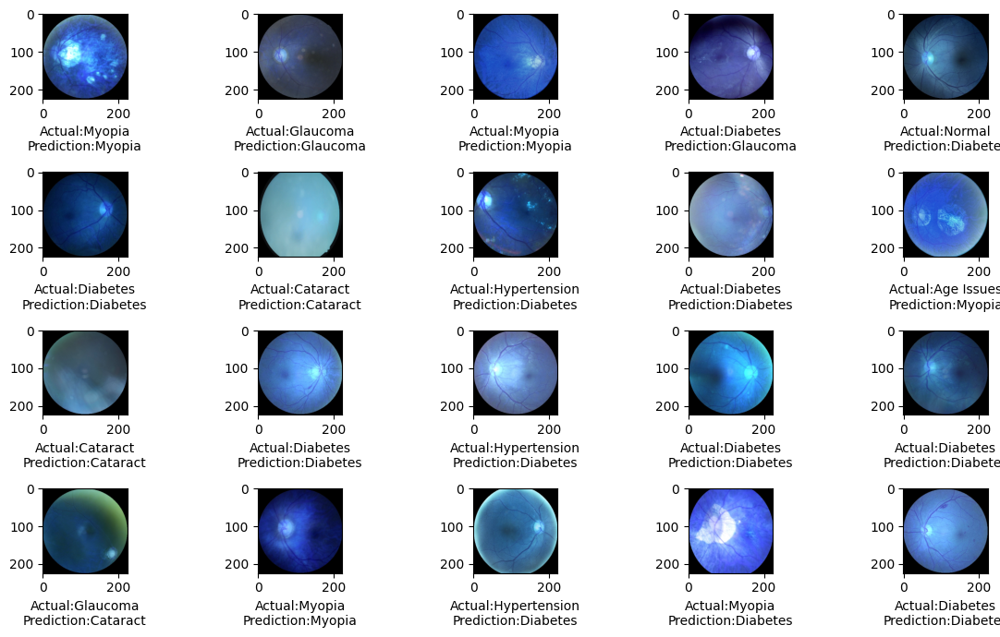

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_densenet.save("ODIR_densenet.h5")

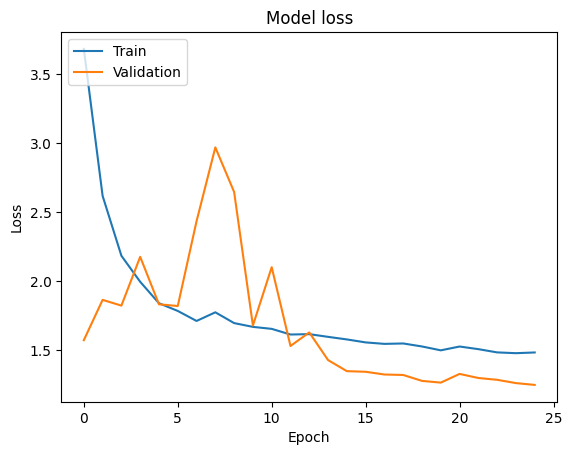

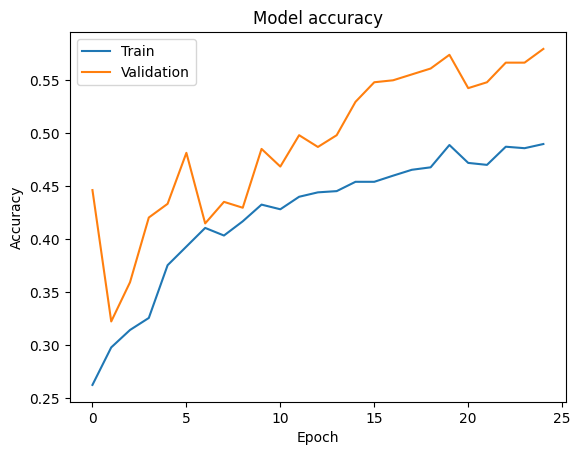

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_densenet.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        79
           1       0.81      0.84      0.82        56
           2       0.40      0.96      0.56       157
           3       0.48      0.39      0.43        57
           4       0.00      0.00      0.00        36
           5       0.81      0.76      0.79        58
           6       0.00      0.00      0.00        60
           7       0.00      0.00      0.00        37

    accuracy                           0.49       540
   macro avg       0.31      0.37      0.32       540
weighted avg       0.34      0.49      0.38       540



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Inception V3

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
inception = InceptionV3(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
for layer in inception.layers:
    layer.trainable = False

In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten,Dense
from tensorflow.keras import Model
flat = Flatten()(inception.output)
output = Dense(8, activation="sigmoid")(flat)

In [ ]:
final_inception = tf.keras.models.Model(inputs=[inception.input], outputs=[output])

In [ ]:
final_inception.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 111, 111, 32)   │            864 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_7     │ (None, 111, 111, 32)   │             96 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 111, 111, 32)   │              0 │ batch_normalization_7… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 109, 109, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_8     │ (None, 109, 109, 32)   │             96 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 109, 109, 32)   │              0 │ batch_normalization_8… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 109, 109, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_9     │ (None, 109, 109, 64)   │            192 │ conv2d_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 109, 109, 64)   │              0 │ batch_normalization_9… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 54, 54, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 54, 54, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_10    │ (None, 54, 54, 80)     │            240 │ conv2d_7[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 54, 54, 80)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 52, 52, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_11    │ (None, 52, 52, 192)    │            576 │ conv2d_8[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 22,212,392 (84.73 MB)

 Trainable params: 409,608 (1.56 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
final_inception.compile(optimizer="adam",loss="binary_crossentropy",metrics=["accuracy"])


In [ ]:
count = 0
for layer in final_inception.layers:
  count = count +1
print(count)



313


In [ ]:
history = final_inception.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=25, callbacks=[early_stopping_callback])


Epoch 1/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - accuracy: 0.7192 - loss: 6.1902 - val_accuracy: 0.6407 - val_loss: 3.5903
Epoch 2/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8621 - loss: 1.3512 - val_accuracy: 0.6056 - val_loss: 4.7347
Epoch 3/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8538 - loss: 1.3957 - val_accuracy: 0.6426 - val_loss: 4.3375
Epoch 4/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.8496 - loss: 1.5235 - val_accuracy: 0.6796 - val_loss: 4.2107
Epoch 5/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.8286 - loss: 1.6022 - val_accuracy: 0.6704 - val_loss: 6.2378
Epoch 6/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.8523 - loss: 1.6069 - val_accuracy: 0.7407 - val_loss: 3.4153
Epoch 7/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.8626 - loss: 1.3158 - val_accuracy: 0.6926 - val_loss: 5.0187
Epoch 8/25
135/135 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - accuracy: 0.7787 - loss: 2.7841 - va

In [ ]:
train_loss, train_accuracy = final_inception.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

val_loss, val_accuracy = final_inception.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_inception.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 89.71%
Validation Accuracy: 74.26%
Test Accuracy: 71.30%


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_inception.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

17/17 ━━━━━━━━━━━━━━━━━━━━ 11s 347ms/step
[1, 3, 1, 2, 5, 3, 3, 1, 1, 6, 6, 3, 6, 2, 1, 7, 1, 5, 6, 5, 3, 6, 2, 3, 2, 0, 0, 2, 2, 1, 2, 4, 3, 4, 2, 2, 2, 3, 4, 3, 2, 5, 3, 2, 2, 0, 6, 2, 1, 5, 2, 1, 6, 4, 2, 5, 0, 3, 6, 1, 2, 4, 2, 6, 2, 2, 2, 2, 2, 5, 1, 2, 2, 5, 2, 0, 1, 0, 2, 6, 2, 3, 3, 5, 5, 2, 0, 2, 5, 5, 5, 6, 2, 2, 3, 5, 1, 6, 1, 7, 5, 5, 2, 3, 2, 5, 2, 5, 3, 2, 6, 3, 5, 6, 4, 6, 2, 0, 1, 5, 1, 2, 2, 2, 3, 2, 5, 0, 2, 4, 6, 2, 2, 2, 2, 6, 6, 1, 2, 2, 6, 6, 5, 5, 1, 1, 3, 2, 2, 4, 4, 2, 4, 3, 4, 2, 7, 6, 2, 3, 5, 2, 5, 5, 3, 3, 6, 2, 2, 6, 5, 2, 2, 6, 6, 2, 1, 1, 6, 2, 2, 3, 1, 2, 6, 6, 2, 2, 2, 2, 6, 2, 7, 3, 2, 1, 0, 3, 2, 1, 2, 5, 2, 6, 2, 5, 3, 2, 0, 5, 2, 2, 2, 2, 1, 2, 4, 6, 6, 5, 2, 5, 2, 3, 5, 3, 6, 5, 1, 4, 2, 5, 2, 1, 1, 2, 1, 6, 3, 2, 2, 0, 3, 6, 1, 1, 2, 1, 1, 2, 1, 6, 1, 6, 0, 6, 0, 2, 6, 2, 2, 2, 2, 2, 1, 2, 5, 1, 3, 2, 1, 2, 4, 6, 5, 2, 5, 6, 5, 2, 2, 2, 6, 5, 2, 4, 6, 3, 2, 3, 7, 2, 7, 4, 2, 1, 2, 1, 3, 5, 2, 3, 2, 1, 2, 3, 2, 2, 3, 2, 2, 6, 2, 5, 1, 0, 1, 2, 3, 

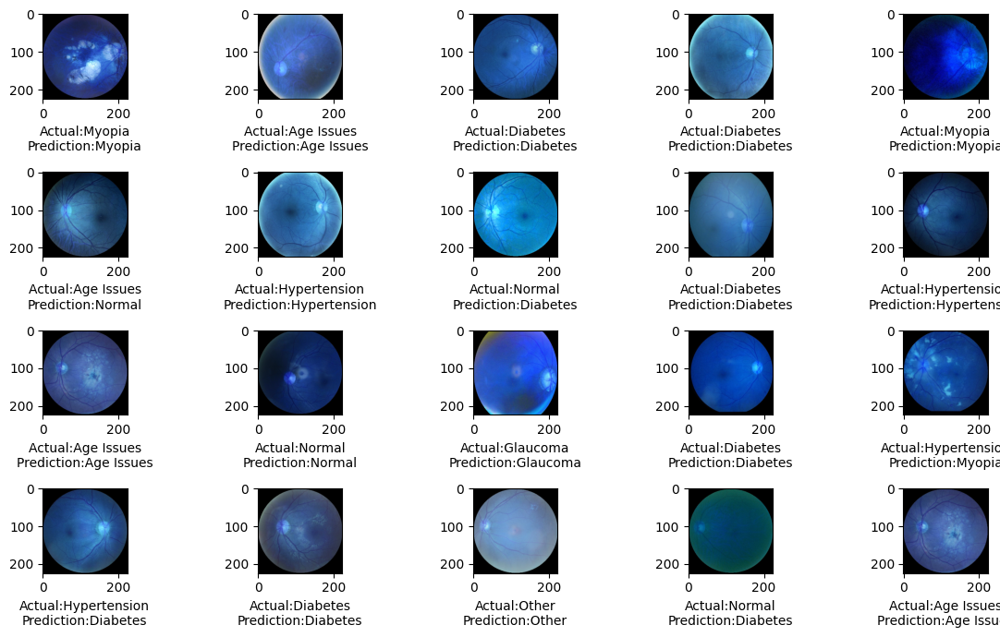

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_inception.save("ODIR_inception.h5")

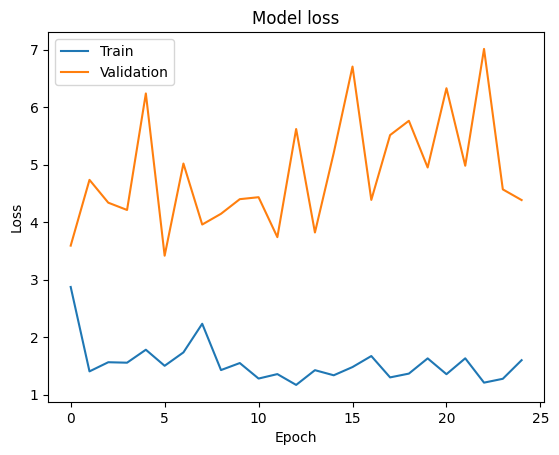

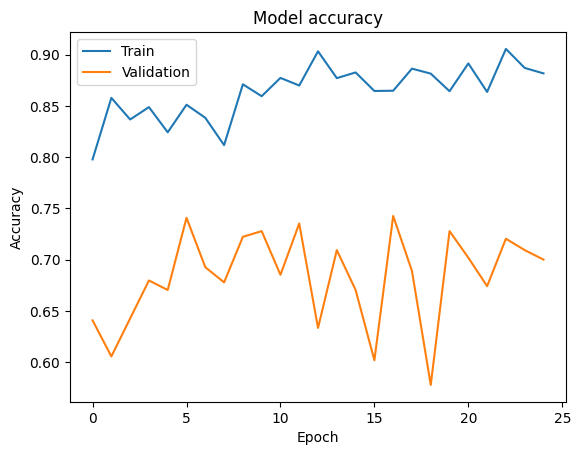

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_inception.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step
              precision    recall  f1-score   support

           0       0.71      0.19      0.30        79
           1       0.88      1.00      0.93        56
           2       0.67      0.88      0.76       157
           3       0.61      0.70      0.65        57
           4       0.81      0.58      0.68        36
           5       0.80      0.95      0.87        58
           6       0.64      0.77      0.70        60
           7       0.93      0.38      0.54        37

    accuracy                           0.71       540
   macro avg       0.75      0.68      0.68       540
weighted avg       0.73      0.71      0.68       540



# ODIR.NET


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

In [ ]:
inputs = tf.keras.Input(shape=(224, 224, 3))

conv1 = layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(inputs)
pool1 = layers.MaxPooling2D((2, 2))(conv1)

conv2 = layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(pool1)
bn1 = layers.BatchNormalization()(conv2)
pool2 = layers.MaxPooling2D((2, 2))(bn1)

conv3 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(pool2)
bn2 = layers.BatchNormalization()(conv3)

conv4 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(bn2)
bn3 = layers.BatchNormalization()(conv4)
pool3 = layers.MaxPooling2D((2, 2))(bn3)

conv5 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(pool3)
bn4 = layers.BatchNormalization()(conv5)

conv6 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(bn4)
bn5 = layers.BatchNormalization()(conv6)
pool4 = layers.MaxPooling2D((2, 2))(bn5)

flat = layers.Flatten()(pool4)
dense1 = layers.Dense(128, activation='relu', kernel_initializer='he_uniform')(flat)
bn6 = layers.BatchNormalization()(dense1)

output = layers.Dense(8, activation='softmax')(bn6)

In [ ]:
final_model = tf.keras.Model(inputs=inputs, outputs=output)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.01)
final_model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
final_model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 112, 112, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 112, 112, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 56, 56, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 56, 56, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 56, 56, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 56, 56, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 56, 56, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 28, 28, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 128)                 │             5

 Total params: 3,501,608 (13.36 MB)

 Trainable params: 3,500,520 (13.35 MB)

 Non-trainable params: 1,088 (4.25 KB)

In [ ]:
count = 0
for layer in final_model.layers:
  count = count +1
print(count)



20


In [ ]:
history = final_model.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=60, callbacks=[early_stopping_callback], class_weight=class_weight)


Epoch 1/60
135/135 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.9560 - loss: 0.1043 - val_accuracy: 0.7500 - val_loss: 1.0670
Epoch 2/60
135/135 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.9343 - loss: 0.1496 - val_accuracy: 0.6037 - val_loss: 1.5739
Epoch 3/60
135/135 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step - accuracy: 0.9123 - loss: 0.2203 - val_accuracy: 0.7259 - val_loss: 1.3027
Epoch 4/60
135/135 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step - accuracy: 0.9475 - loss: 0.1536 - val_accuracy: 0.7500 - val_loss: 1.1313
Epoch 5/60
135/135 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step - accuracy: 0.9503 - loss: 0.1259 - val_accuracy: 0.7852 - val_loss: 1.0163
Epoch 6/60
135/135 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.9513 - loss: 0.1209 - val_accuracy: 0.7741 - val_loss: 1.0591
Epoch 7/60
135/135 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.9603 - loss: 0.0991 - val_accuracy: 0.7556 - val_loss: 0.9703
Epoch 8/60
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.9570 - loss: 0.1134 - va

In [ ]:
train_loss, train_accuracy = final_model.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")
print("Train loss :", train_loss)

val_loss, val_accuracy = final_model.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_model.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
print("Test loss:" ,test_loss)

Training Accuracy: 91.57%
Train loss : 0.26258277893066406
Validation Accuracy: 75.00%
Test Accuracy: 72.96%
Test loss: 1.284470558166504


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_model.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step
[6, 2, 6, 3, 4, 6, 2, 2, 2, 2, 2, 2, 0, 5, 2, 2, 2, 4, 5, 2, 5, 3, 6, 2, 0, 0, 3, 2, 1, 7, 4, 3, 5, 3, 2, 7, 1, 2, 2, 3, 1, 5, 1, 1, 7, 2, 1, 2, 4, 4, 1, 0, 6, 2, 2, 5, 2, 5, 2, 2, 5, 0, 6, 7, 5, 5, 1, 2, 1, 2, 1, 6, 0, 2, 2, 2, 2, 7, 1, 2, 5, 4, 2, 0, 3, 2, 1, 4, 2, 2, 2, 2, 7, 2, 2, 7, 2, 6, 4, 4, 2, 2, 6, 4, 1, 2, 2, 7, 3, 2, 3, 1, 5, 2, 1, 6, 6, 3, 3, 2, 2, 0, 6, 3, 2, 6, 1, 2, 4, 5, 2, 5, 2, 6, 5, 2, 6, 4, 2, 0, 2, 2, 3, 6, 6, 2, 3, 2, 2, 5, 4, 2, 2, 3, 2, 3, 1, 2, 4, 2, 5, 2, 1, 2, 7, 6, 6, 2, 3, 2, 4, 3, 3, 4, 2, 0, 1, 6, 2, 2, 5, 6, 1, 3, 0, 4, 7, 6, 5, 3, 1, 1, 2, 5, 7, 2, 4, 0, 3, 2, 2, 2, 3, 7, 3, 2, 2, 0, 2, 0, 2, 0, 2, 1, 2, 0, 1, 2, 7, 7, 3, 6, 6, 3, 2, 2, 4, 3, 1, 5, 3, 1, 5, 2, 1, 7, 2, 2, 2, 2, 6, 2, 2, 3, 7, 2, 5, 2, 1, 3, 2, 6, 6, 3, 2, 5, 1, 5, 0, 2, 2, 2, 4, 3, 1, 5, 4, 2, 0, 3, 1, 2, 2, 1, 6, 2, 4, 2, 6, 2, 1, 3, 0, 7, 2, 3, 6, 2, 4, 2, 2, 1, 3, 2, 6, 2, 1, 2, 2, 2, 4, 5, 2, 2, 1, 3, 1, 2, 1, 4, 6, 1, 6, 1, 1, 2, 0, 2, 2, 3,

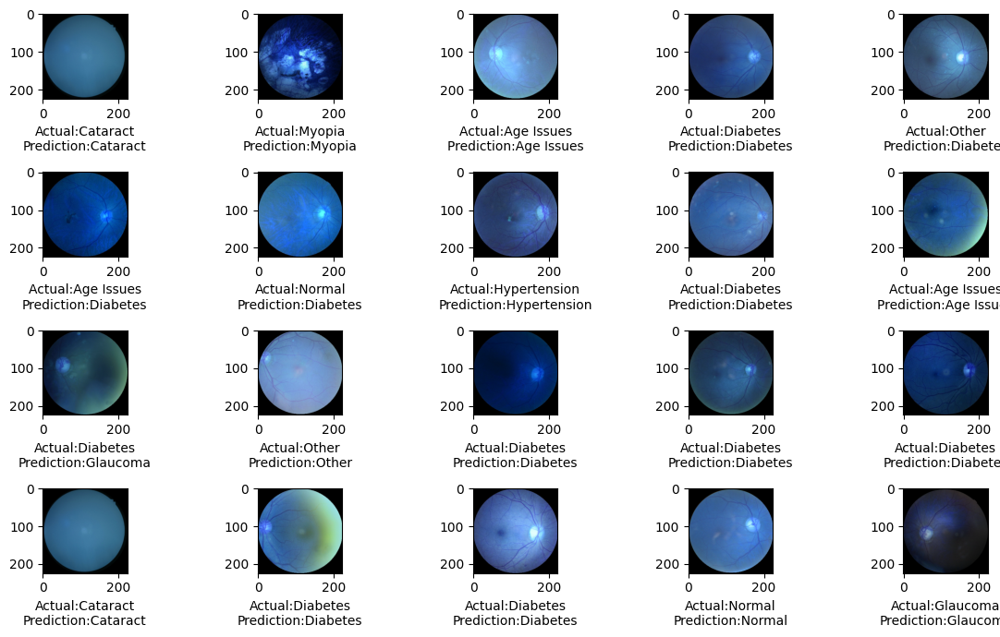

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_model.save("ODIR_self.h5")

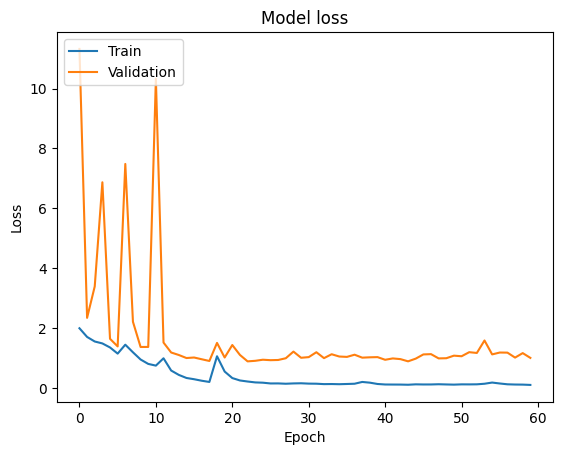

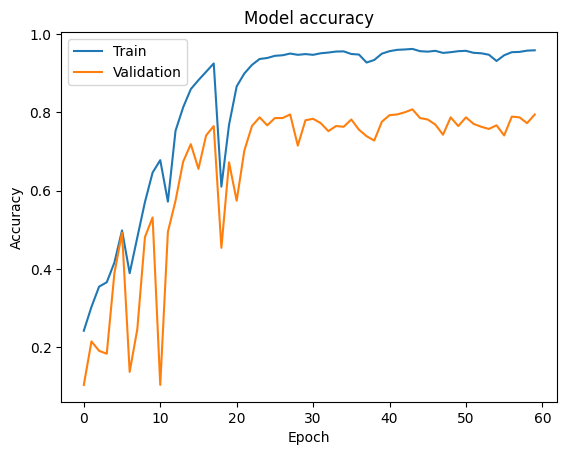

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_model.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
              precision    recall  f1-score   support

           0       0.81      0.40      0.54        75
           1       0.87      0.95      0.91        57
           2       0.80      0.87      0.83       174
           3       0.66      0.77      0.71        60
           4       0.69      0.76      0.72        38
           5       0.83      0.95      0.88        40
           6       0.84      0.82      0.83        60
           7       0.75      0.75      0.75        36

    accuracy                           0.79       540
   macro avg       0.78      0.78      0.77       540
weighted avg       0.79      0.79      0.78       540



In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, matthews_corrcoef

# Assuming y_true_classes and y_pred_classes are your true and predicted labels
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)

# Calculate per-class metrics
precision1 = precision_score(y_true_classes, y_pred_classes, average=None)
recall1 = recall_score(y_true_classes, y_pred_classes, average=None)
f11 = f1_score(y_true_classes, y_pred_classes, average=None)
mcc1 = matthews_corrcoef(y_true_classes, y_pred_classes)

# For specificity, we need to compute it manually
specificity1 = []
for i in range(conf_matrix.shape[0]):
    # True Negatives: sum all elements except the ith row and ith column
    tn = np.sum(np.delete(np.delete(conf_matrix, i, axis=0), i, axis=1))
    # False Positives: sum the ith column except the diagonal
    fp = np.sum(conf_matrix[:, i]) - conf_matrix[i, i]
    # False Negatives: sum the ith row except the diagonal
    fn = np.sum(conf_matrix[i, :]) - conf_matrix[i, i]
    # True Positives: diagonal element
    tp = conf_matrix[i, i]
    specificity1.append(tn / (tn + fp))

print(f"Precision per class: {precision1}")
print(f"Recall per class: {recall1}")
print(f"F1 Score per class: {f11}")
print(f"Specificity per class: {specificity1}")
print(f"Matthews Correlation Coefficient (MCC): {mcc1}")


Precision per class: [0.81081081 0.87096774 0.7989418  0.65714286 0.69047619 0.82608696
 0.84482759 0.75      ]
Recall per class: [0.4        0.94736842 0.86781609 0.76666667 0.76315789 0.95
 0.81666667 0.75      ]
F1 Score per class: [0.53571429 0.90756303 0.83195592 0.70769231 0.725      0.88372093
 0.83050847 0.75      ]
Specificity per class: [0.9849462365591398, 0.9834368530020704, 0.8961748633879781, 0.95, 0.9741035856573705, 0.984, 0.98125, 0.9821428571428571]
Matthews Correlation Coefficient (MCC): 0.7418737120239263


In [ ]:
print(conf_matrix)

[[ 30   5  14  13   2   2   5   4]
 [  1  54   0   0   0   0   0   2]
 [  2   0 151   5   7   3   3   3]
 [  2   1   7  46   1   2   1   0]
 [  1   2   4   2  29   0   0   0]
 [  0   0   0   2   0  38   0   0]
 [  1   0   5   2   2   1  49   0]
 [  0   0   8   0   1   0   0  27]]


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix

# Assuming y_true_classes and y_pred_classes are your true and predicted labels
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)

# Initialize lists to store TP, TN, FP, FN for each class
tp_list = []
tn_list = []
fp_list = []
fn_list = []

# Iterate over each class index
for i in range(conf_matrix.shape[0]):
    tp = conf_matrix[i, i]
    fp = np.sum(conf_matrix[:, i]) - tp
    fn = np.sum(conf_matrix[i, :]) - tp
    tn = np.sum(conf_matrix) - (tp + fp + fn)

    tp_list.append(tp)
    tn_list.append(tn)
    fp_list.append(fp)
    fn_list.append(fn)

print(f"True Positives per class: {tp_list}")
print(f"True Negatives per class: {tn_list}")
print(f"False Positives per class: {fp_list}")
print(f"False Negatives per class: {fn_list}")


True Positives per class: [30, 54, 151, 46, 29, 38, 49, 27]
True Negatives per class: [458, 475, 328, 456, 489, 492, 471, 495]
False Positives per class: [7, 8, 38, 24, 13, 8, 9, 9]
False Negatives per class: [45, 3, 23, 14, 9, 2, 11, 9]


In [ ]:
for layer in final_model.layers:
    # Check if the layer has an 'output_shape' attribute
    output_shape = getattr(layer, 'output_shape', 'N/A')
    print(f"Layer Name: {layer.name}")

Layer Name: input_layer_3
Layer Name: conv2d_10
Layer Name: max_pooling2d_4
Layer Name: conv2d_11
Layer Name: batch_normalization_10
Layer Name: max_pooling2d_5
Layer Name: conv2d_12
Layer Name: batch_normalization_11
Layer Name: conv2d_13
Layer Name: batch_normalization_12
Layer Name: max_pooling2d_6
Layer Name: conv2d_14
Layer Name: batch_normalization_13
Layer Name: conv2d_15
Layer Name: batch_normalization_14
Layer Name: max_pooling2d_7
Layer Name: flatten_3
Layer Name: dense_8
Layer Name: batch_normalization_15
Layer Name: dense_9
